<a href="https://colab.research.google.com/github/camilamaestrelli/Demand-Forecasting-Regression_Competition/blob/main/9th_Competition_EDA_toGit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color=BLUE size=10> 9ª Competição FLAI de 
# <font color=BLUE size=12> MACHINE LEARNING

***
**Author**: [Camila Maestrelli](https://www.linkedin.com/in/camila-maestrelli-leobons/)

Este notebook é relativo à Competição de Machine Learning da Flai -

## <b>Etapas do projeto: </b>

### 1. Definição do problema
### 2. Importação dos dados
### 3. Entendimento dos dados
### 4. Limpeza dos dados
### 5. Análise exploratória
### 6. Pré-processamento
### 7. Algoritmo e criação do modelo
### 8. Interpretação dos resultados e avaliação dos modelos


## <font color=green> <b> 1. Definição do problema </b>

#### <b> Objetivo: </b>

* Prever a demanda de aluguéis de bicicleta a partir de variáveis de clima e dia, obtendo o menor valor de RMSE


## <font color=green> <b> 2. Importação dos dados </b>

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 30)
pd.set_option('display.max_rows', 100)

# visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv

# ANOVA
#!pip install statsmodels
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scipy.stats as stats

# Machine Learning library
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor

#!pip install lightgbm
from lightgbm.sklearn import LGBMRegressor
#!pip install xgboost
from xgboost import XGBRegressor

from sklearn.model_selection import cross_validate, RepeatedKFold, KFold, cross_val_predict
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import Pipeline


from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler # used when there are many outliers
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import FunctionTransformer

#!pip install category_encoders
import category_encoders as ce   

from sklearn.impute import SimpleImputer, KNNImputer      
from sklearn.compose import ColumnTransformer
from sklearn.compose import TransformedTargetRegressor

#metrics
from sklearn.metrics import mean_absolute_error , r2_score, mean_squared_error

import warnings
from datetime import datetime

In [ ]:
train_url = 'dados/treino.csv'
test_url = 'dados/teste.csv'

treino = pd.read_csv(train_url)
teste = pd.read_csv(test_url)

display(treino.head())
treino.shape

,hora,dia,feriado,estação,temperatura,chuva,umidade,sol,visibilidade,vento,aluguéis
0,16,sábado,não,verão,39.4,0.0,61.1,2.19,92.0%,3.49,1318
1,21,sexta,não,primavera,22.2,0.0,63.3,0.00,32.0%,2.89,686
2,16,segunda,não,verão,40.5,0.0,52.8,2.51,93.0%,3.97,831
3,7,segunda,sim,outono,25.6,0.0,70.9,0.00,97.0%,1.09,15
4,9,segunda,não,verão,39.9,0.0,58.1,1.69,62.0%,1.09,865


(4500, 11)

## <font color=green> <b> 3. Entendimento dos dados </b>

* A análise visual das variáveis nos mostra que seus nomes são bem intuitivos

In [ ]:
treino.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4500 entries, 0 to 4499
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hora          4500 non-null   int64  
 1   dia           4500 non-null   object 
 2   feriado       4500 non-null   object 
 3   estação       4500 non-null   object 
 4   temperatura   4500 non-null   float64
 5   chuva         4500 non-null   float64
 6   umidade       4500 non-null   float64
 7   sol           4500 non-null   float64
 8   visibilidade  4500 non-null   object 
 9   vento         4500 non-null   float64
 10  aluguéis      4500 non-null   int64  
dtypes: float64(5), int64(2), object(4)
memory usage: 386.8+ KB


In [ ]:
teste.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hora          3000 non-null   int64  
 1   dia           3000 non-null   object 
 2   feriado       3000 non-null   object 
 3   estação       3000 non-null   object 
 4   temperatura   3000 non-null   float64
 5   chuva         3000 non-null   float64
 6   umidade       3000 non-null   float64
 7   sol           3000 non-null   float64
 8   visibilidade  3000 non-null   object 
 9   vento         3000 non-null   float64
dtypes: float64(5), int64(1), object(4)
memory usage: 234.5+ KB


In [ ]:
for coluna in treino.columns:
    print("Variável: ", coluna)
    print(treino[coluna].nunique(), ' distintos no treino')
    if coluna in teste.columns:
        print(teste[coluna].nunique(), ' distintos no teste')  
        if treino[coluna].nunique() != teste[coluna].nunique():
            print('Valores que tem no teste e não no treino: ',
                  set(teste[coluna].unique()).difference(set(treino[coluna].unique())))
            print('Valores que tem no treino e não no teste: ',
                  set(treino[coluna].unique()).difference(set(teste[coluna].unique())))
            
    display(treino[coluna].unique())
    print('---'*20)

Variável:  hora
24  distintos no treino
24  distintos no teste


array([16, 21,  7,  9, 10,  5, 19, 22,  4,  3,  1, 11,  0, 14, 20,  6, 17,
       13, 18,  8, 23,  2, 12, 15], dtype=int64)

------------------------------------------------------------
Variável:  dia
7  distintos no treino
7  distintos no teste


array(['sábado', 'sexta', 'segunda', 'quarta', 'domingo', 'quinta',
       'terça'], dtype=object)

------------------------------------------------------------
Variável:  feriado
2  distintos no treino
2  distintos no teste


array(['não', 'sim'], dtype=object)

------------------------------------------------------------
Variável:  estação
4  distintos no treino
4  distintos no teste


array(['verão', 'primavera', 'outono', 'inverno'], dtype=object)

------------------------------------------------------------
Variável:  temperatura
359  distintos no treino
339  distintos no teste
Valores que tem no teste e não no treino:  {7.3, 8.8, 9.6, 9.8, 43.0, 44.1, 41.4}
Valores que tem no treino e não no teste:  {6.5, 7.1, 7.6, 8.9, 8.5, 11.7, 11.0, 12.5, 13.0, 8.2, 9.7, 10.2, 7.4, 40.0, 41.0, 42.1, 42.0, 44.6, 43.7, 43.5, 43.6, 43.1, 42.8, 44.3, 42.4, 6.7, 7.7}


array([39.4, 22.2, 40.5, 25.6, 39.9, 27.5, 26. , 28.4, 19.2, 21.8,  8.6,
       12.7, 19.6, 13.5, 36.1, 32.4, 35.4, 33.4, 31.2, 29.6, 38. , 11.9,
       32.5, 32.2, 11.7, 33.9, 23.4, 33.1, 40.3, 21. , 17.7, 13.3, 14.9,
       40.7, 19.9, 33.8, 18.3, 33.5, 27. , 22.5, 20.7, 23.6, 38.8, 30.1,
       40.1, 37.5, 32. , 29.5, 31.9, 21.1, 26.9, 18.7, 19.8, 34.9, 31.8,
       23.2, 17.6, 30.8, 31.4, 23.7, 36.8, 36.9, 20.3, 20.9, 37.8, 15.7,
       36.3, 37.3, 21.7, 16.6, 20.8, 23.3, 24.2, 35.7, 37.7, 30.7, 32.1,
       38.1, 29.3, 28.7, 30.4, 34. , 33. , 22.8, 37. , 16.1, 31. , 21.5,
       38.4, 37.2, 26.7, 33.2, 14.7, 11.3, 35.9, 32.3, 36.4, 34.8, 34.7,
       44.6, 30.5, 34.2, 41. , 32.7, 17.1, 19.5, 27.1, 19.4, 26.3, 31.1,
       25.4, 36.7, 22.1, 10.7, 40.9, 35.5, 24.3, 15. , 39.1, 35.2, 30.6,
       24.7, 26.6, 17.3, 24.9, 11.4, 24.8, 32.9, 12.2, 26.2, 25.9, 42.1,
       28. , 17.8, 10.6, 18.2, 16.3, 15.9, 41.7, 29.1, 35. , 41.9, 31.3,
       21.3, 35.1, 21.9, 26.5, 14.2, 31.7, 22.6, 18

------------------------------------------------------------
Variável:  chuva
47  distintos no treino
37  distintos no teste
Valores que tem no teste e não no treino:  {1.61, 4.26, 40.32, 8.64, 10.48, 11.52, 10.94, 13.25, 17.86, 24.19}
Valores que tem no treino e não no teste:  {0.81, 1.5, 2.76, 2.19, 1.38, 3.8, 6.22, 2.07, 9.79, 9.22, 12.1, 13.82, 14.4, 15.55, 14.98, 16.7, 18.43, 19.58, 21.89, 27.65}


array([ 0.  ,  4.03,  1.73,  0.58, 27.65,  0.12,  2.88,  0.46,  9.79,
        7.37,  1.15,  3.46,  0.35,  6.91, 20.74, 14.4 ,  0.23,  2.3 ,
        5.18, 12.1 ,  4.61,  3.8 , 21.31,  6.22,  2.07,  7.49, 19.58,
        1.27,  0.81,  1.04,  0.92,  6.34,  2.76,  9.22,  1.84, 21.89,
        1.38,  8.06,  1.5 ,  5.76, 15.55, 18.43, 10.37, 14.98,  2.19,
       13.82, 16.7 ])

------------------------------------------------------------
Variável:  umidade
87  distintos no treino
89  distintos no teste
Valores que tem no teste e não no treino:  {25.6, 27.1}
Valores que tem no treino e não no teste:  set()


array([61.1, 63.3, 52.8, 70.9, 58.1, 37.7, 78.4, 87.5, 73.9, 48.3, 44.5,
       42.2, 43.7, 40.7, 70.1, 76.2, 71.6, 62.6, 67.1, 49. , 83. , 36.2,
       49.8, 45.2, 75.4, 59.6, 68.6, 80.7, 40. , 85.2, 46.8, 61.8, 90.5,
       64.1, 89.7, 88.2, 55.8, 81.4, 39.2, 47.5, 58.8, 57.3, 46. , 55. ,
       53.5, 64.9, 74.7, 77.7, 82.2, 79.9, 89. , 51.3, 91.2, 69.4, 67.9,
       60.3, 43. , 33.9, 56.6, 65.6, 50.5, 79.2, 41.5, 38.5, 73.1, 72.4,
       66.4, 76.9, 30.9, 34.7, 54.3, 83.7, 32.4, 52. , 92. , 35.4, 84.5,
       37. , 29.4, 86.7, 18.1, 28.7, 33.2, 86. , 31.7, 30.2, 27.9])

------------------------------------------------------------
Variável:  sol
337  distintos no treino
324  distintos no teste
Valores que tem no teste e não no treino:  {2.97, 3.38, 3.27, 3.31, 3.44, 3.1}
Valores que tem no treino e não no teste:  {0.91, 1.47, 2.13, 3.04, 3.25, 2.9, 2.26, 2.7, 3.2, 1.31, 3.22, 3.08, 3.19, 3.49, 2.44, 2.69, 3.35, 2.89, 3.07}


array([2.19, 0.  , 2.51, 1.69, 2.25, 2.83, 0.78, 0.11, 1.8 , 0.56, 0.95,
       1.49, 0.16, 0.86, 0.58, 0.8 , 0.09, 1.5 , 0.45, 3.21, 0.72, 0.07,
       0.41, 0.27, 2.49, 0.99, 1.66, 2.41, 0.35, 0.65, 2.68, 2.94, 0.18,
       1.  , 2.14, 3.26, 2.37, 0.04, 0.23, 1.95, 1.85, 0.05, 0.9 , 1.11,
       1.35, 0.68, 1.08, 0.01, 3.24, 1.68, 2.42, 2.43, 2.24, 1.14, 0.57,
       1.07, 0.22, 1.25, 0.28, 2.07, 1.05, 1.18, 0.93, 0.02, 1.03, 1.24,
       0.1 , 0.6 , 2.5 , 1.75, 2.58, 3.09, 0.49, 0.75, 1.72, 1.73, 3.19,
       1.1 , 0.24, 0.39, 1.38, 0.52, 0.71, 0.43, 0.51, 0.47, 2.08, 0.19,
       1.21, 0.83, 0.32, 2.29, 0.21, 1.01, 1.09, 3.28, 1.44, 0.66, 0.84,
       1.28, 0.81, 1.06, 0.63, 0.67, 0.37, 1.96, 3.18, 0.91, 1.26, 2.31,
       0.15, 1.34, 2.13, 0.64, 0.34, 0.06, 1.19, 3.05, 0.29, 0.53, 0.25,
       0.12, 2.56, 1.16, 2.67, 1.04, 1.39, 1.13, 0.26, 0.96, 1.02, 0.46,
       1.93, 0.88, 0.85, 0.14, 0.79, 1.59, 2.99, 2.11, 1.79, 1.94, 2.06,
       1.43, 1.23, 0.17, 2.1 , 2.23, 2.33, 1.71, 1.

------------------------------------------------------------
Variável:  visibilidade
96  distintos no treino
96  distintos no teste


array(['92.0%', '32.0%', '93.0%', '97.0%', '62.0%', '72.0%', '47.0%',
       '96.0%', '11.0%', '68.0%', '85.0%', '87.0%', '53.0%', '94.0%',
       '42.0%', '50.0%', '86.0%', '84.0%', '95.0%', '29.0%', '39.0%',
       '67.0%', '76.0%', '16.0%', '44.0%', '33.0%', '74.0%', '90.0%',
       '48.0%', '38.0%', '23.0%', '22.0%', '26.0%', '57.0%', '12.0%',
       '56.0%', '25.0%', '13.0%', '71.0%', '41.0%', '75.0%', '21.0%',
       '27.0%', '52.0%', '40.0%', '88.0%', '80.0%', '69.0%', '18.0%',
       '14.0%', '15.0%', '82.0%', '46.0%', '34.0%', '45.0%', '17.0%',
       '91.0%', '9.0%', '66.0%', '28.0%', '54.0%', '79.0%', '35.0%',
       '55.0%', '8.0%', '81.0%', '60.0%', '89.0%', '43.0%', '77.0%',
       '70.0%', '58.0%', '59.0%', '7.0%', '61.0%', '78.0%', '51.0%',
       '83.0%', '19.0%', '37.0%', '10.0%', '30.0%', '36.0%', '63.0%',
       '64.0%', '24.0%', '65.0%', '31.0%', '49.0%', '6.0%', '5.0%',
       '2.0%', '20.0%', '73.0%', '4.0%', '3.0%'], dtype=object)

------------------------------------------------------------
Variável:  vento
61  distintos no treino
57  distintos no teste
Valores que tem no teste e não no treino:  {7.45, 7.09, 7.57}
Valores que tem no treino e não no teste:  {6.49, 6.97, 8.53, 8.29, 9.01, 9.13, 7.21}


array([3.49, 2.89, 3.97, 1.09, 3.01, 1.33, 3.73, 0.97, 1.81, 2.41, 1.93,
       4.45, 1.57, 0.85, 1.21, 2.17, 0.61, 1.69, 2.65, 2.29, 4.93, 1.45,
       3.85, 2.05, 4.09, 4.33, 4.21, 3.61, 3.37, 3.25, 5.89, 2.53, 0.49,
       0.73, 5.77, 2.77, 0.37, 3.13, 8.53, 4.81, 5.17, 4.57, 4.69, 5.53,
       7.21, 6.13, 5.05, 5.41, 0.25, 5.65, 6.25, 6.01, 5.29, 6.61, 6.73,
       6.49, 8.29, 9.13, 6.37, 6.97, 9.01])

------------------------------------------------------------
Variável:  aluguéis
1766  distintos no treino


array([1318,  686,  831, ...,  787, 1874, 1485], dtype=int64)

------------------------------------------------------------


* Nota-se que a variável `visibilidade` está como object ao invés de número. Vamos consertar isso:

In [ ]:
treino['visibilidade'] = treino['visibilidade'].apply(lambda x: x.split('%')[0])
treino['visibilidade'] = pd.to_numeric(treino['visibilidade'])
treino.visibilidade = treino.visibilidade / 100

teste['visibilidade'] = teste['visibilidade'].apply(lambda x: x.split('%')[0])
teste['visibilidade'] = pd.to_numeric(teste['visibilidade'])
teste.visibilidade = teste.visibilidade / 100

In [ ]:
treino.visibilidade.nunique()

96

In [ ]:
treino.describe()

,hora,temperatura,chuva,umidade,sol,visibilidade,vento,aluguéis
count,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000
mean,11.644889,27.108356,0.161864,62.087133,0.578104,0.696940,2.322933,727.169556
std,6.901146,7.976684,1.179291,15.176118,0.878158,0.296047,1.243427,646.886075
min,0.000000,6.500000,0.000000,18.100000,0.000000,0.020000,0.250000,5.000000
25%,6.000000,20.900000,0.000000,50.500000,0.000000,0.450000,1.330000,208.750000
50%,12.000000,27.800000,0.000000,61.100000,0.010000,0.830000,2.050000,534.500000
75%,18.000000,33.500000,0.000000,73.900000,0.940000,0.970000,3.010000,1096.000000
max,23.000000,44.600000,27.650000,92.000000,3.520000,0.970000,9.130000,3566.000000


* Iremos transformar a variável `feriado` em binária : 0 ou 1

In [ ]:
treino.feriado = treino.feriado.map({'sim': 1, 'não': 0})
teste.feriado = teste.feriado.map({'sim': 1, 'não': 0})

In [ ]:
treino.describe()

,hora,feriado,temperatura,chuva,umidade,sol,visibilidade,vento,aluguéis
count,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000,4500.000000
mean,11.644889,0.049778,27.108356,0.161864,62.087133,0.578104,0.696940,2.322933,727.169556
std,6.901146,0.217510,7.976684,1.179291,15.176118,0.878158,0.296047,1.243427,646.886075
min,0.000000,0.000000,6.500000,0.000000,18.100000,0.000000,0.020000,0.250000,5.000000
25%,6.000000,0.000000,20.900000,0.000000,50.500000,0.000000,0.450000,1.330000,208.750000
50%,12.000000,0.000000,27.800000,0.000000,61.100000,0.010000,0.830000,2.050000,534.500000
75%,18.000000,0.000000,33.500000,0.000000,73.900000,0.940000,0.970000,3.010000,1096.000000
max,23.000000,1.000000,44.600000,27.650000,92.000000,3.520000,0.970000,9.130000,3566.000000


* Criar coluna com `dia` da semana numérico

In [ ]:
treino.dia.unique()

array(['sábado', 'sexta', 'segunda', 'quarta', 'domingo', 'quinta',
       'terça'], dtype=object)

In [ ]:
dict_dia = {'domingo': 1,
            'segunda': 2,
            'terça': 3,
            'quarta': 4,
            'quinta': 5,
            'sexta': 6, 
            'sábado': 7}

treino['dia_num'] = treino.dia.map(dict_dia)
teste['dia_num'] = teste.dia.map(dict_dia)


In [ ]:
treino.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4500 entries, 0 to 4499
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   hora          4500 non-null   int64  
 1   dia           4500 non-null   object 
 2   feriado       4500 non-null   int64  
 3   estação       4500 non-null   object 
 4   temperatura   4500 non-null   float64
 5   chuva         4500 non-null   float64
 6   umidade       4500 non-null   float64
 7   sol           4500 non-null   float64
 8   visibilidade  4500 non-null   float64
 9   vento         4500 non-null   float64
 10  aluguéis      4500 non-null   int64  
 11  dia_num       4500 non-null   int64  
dtypes: float64(6), int64(4), object(2)
memory usage: 422.0+ KB


In [ ]:
treino.groupby('feriado')['aluguéis'].mean()

feriado
0    736.782507
1    543.665179
Name: aluguéis, dtype: float64

### Verificando dados duplicados

In [ ]:
dupli = pd.concat([treino,teste])
dupli = dupli.drop(columns='aluguéis', axis=1)
dupli.duplicated().sum()

0

## <font color=green> <b> 4. EDA </b>


### Análise inicial com o Sweetiz

                                             |                                             | [  0%]   00:00 ->…


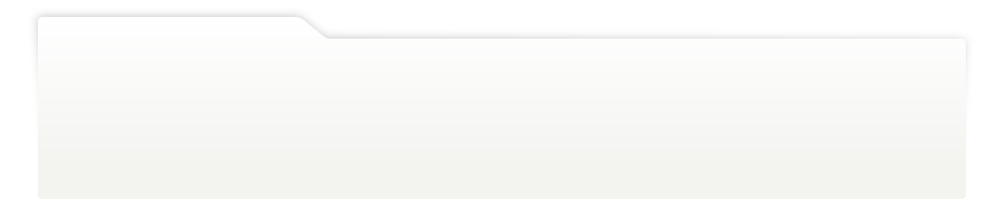
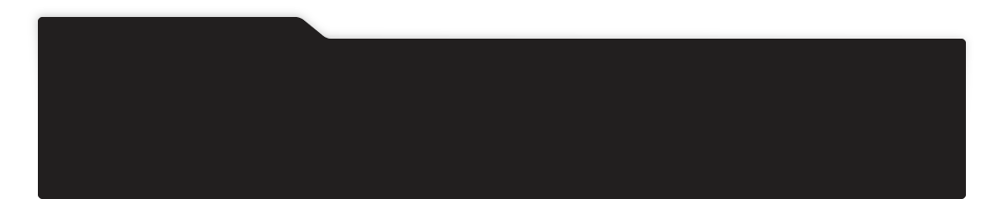
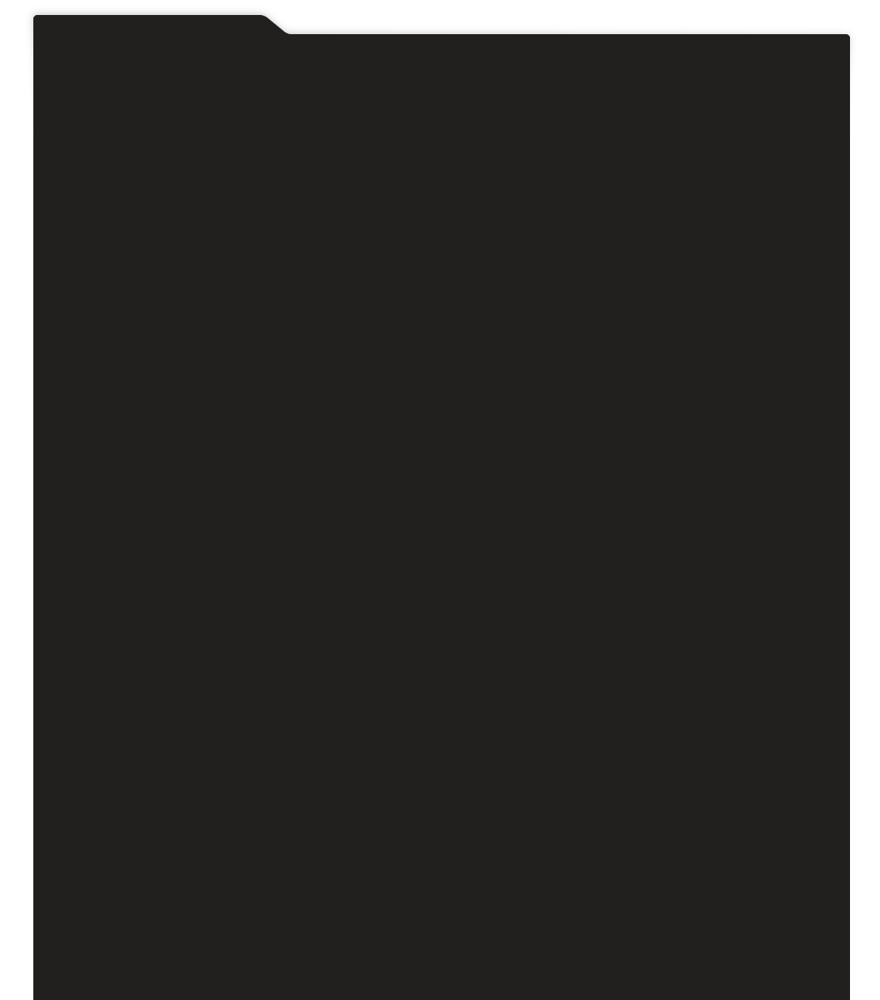
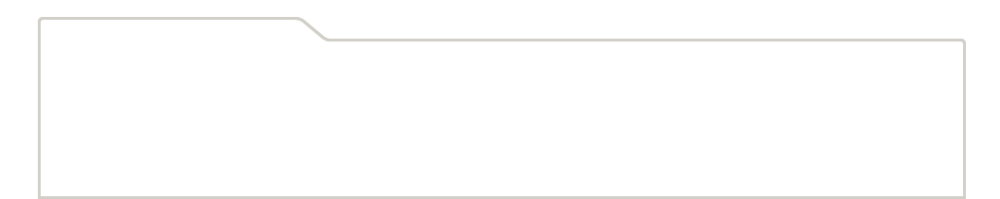
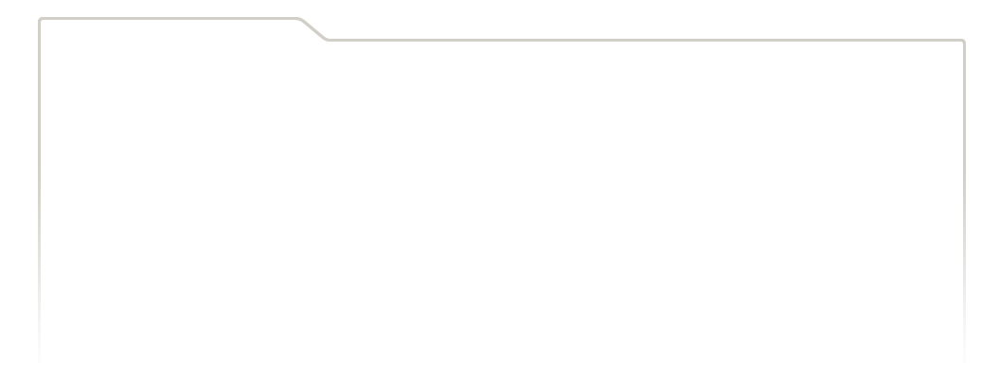
...
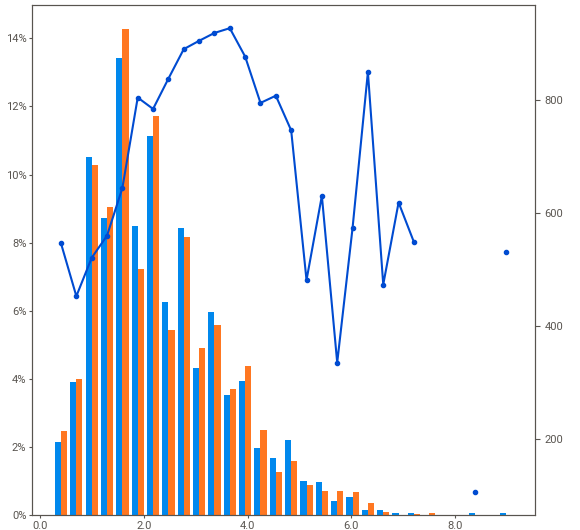
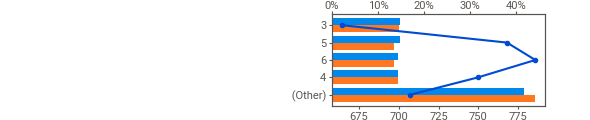
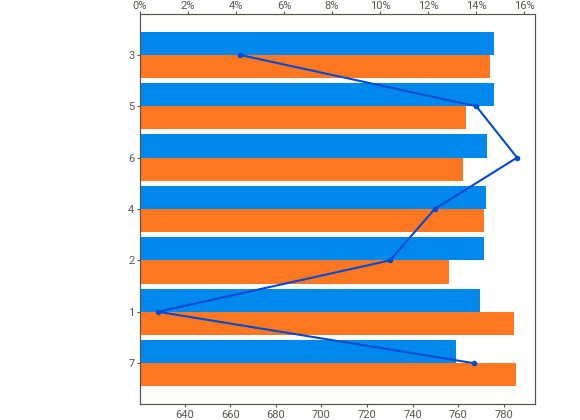
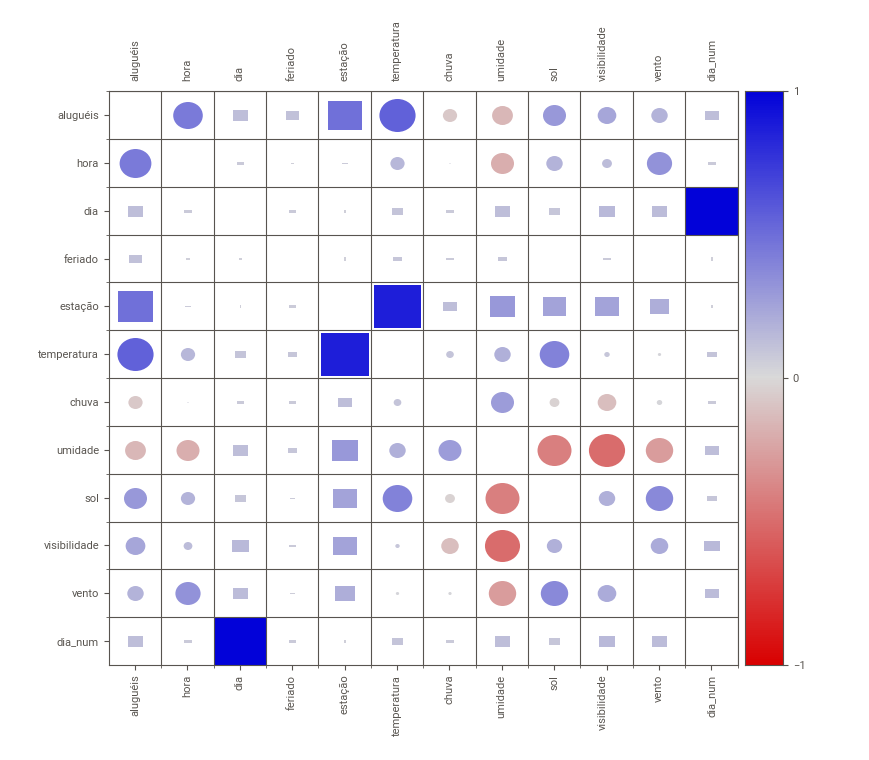
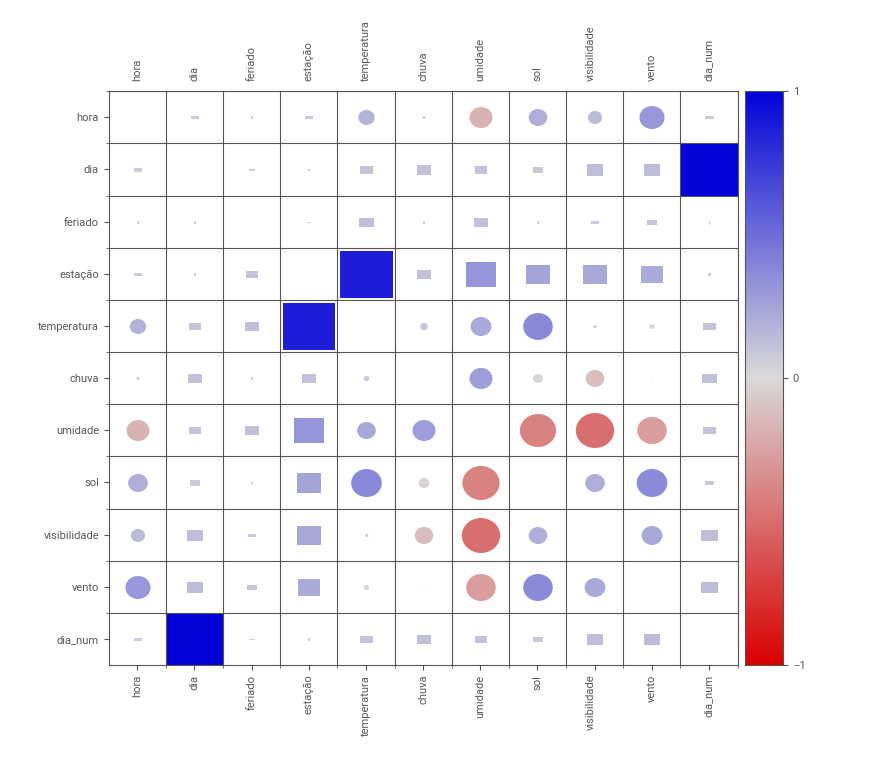

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
# Comparing the train e test datasets
my_report = sv.compare([treino, "Training Data"], [teste, "Test Data"], "aluguéis")
my_report.show_notebook()

### Matriz de correlação

<AxesSubplot:>

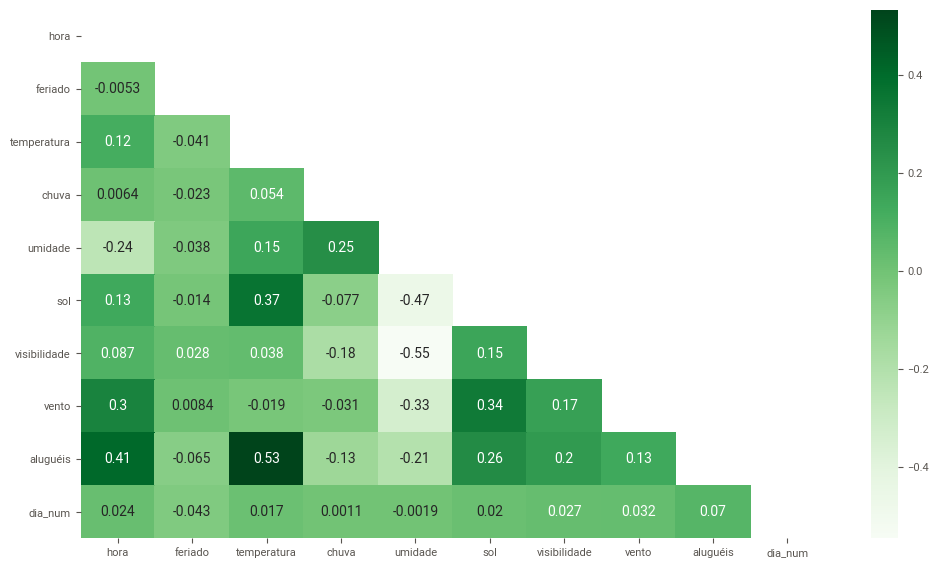

In [ ]:
plt.figure(figsize=(12, 7))
mask = np.triu(np.ones_like(treino.corr(), dtype=bool))
sns.heatmap(treino.corr(), annot=True, cmap='Greens', mask=mask)

* Nota-se uma melhor correlação (linear) entre a temperatura e aluguéis, mesmo esta sendo baixa. Uma boa relação linear acontece até atingir a temperatura de ~35, quando há um declínio dos aluguéis

### Pairplot

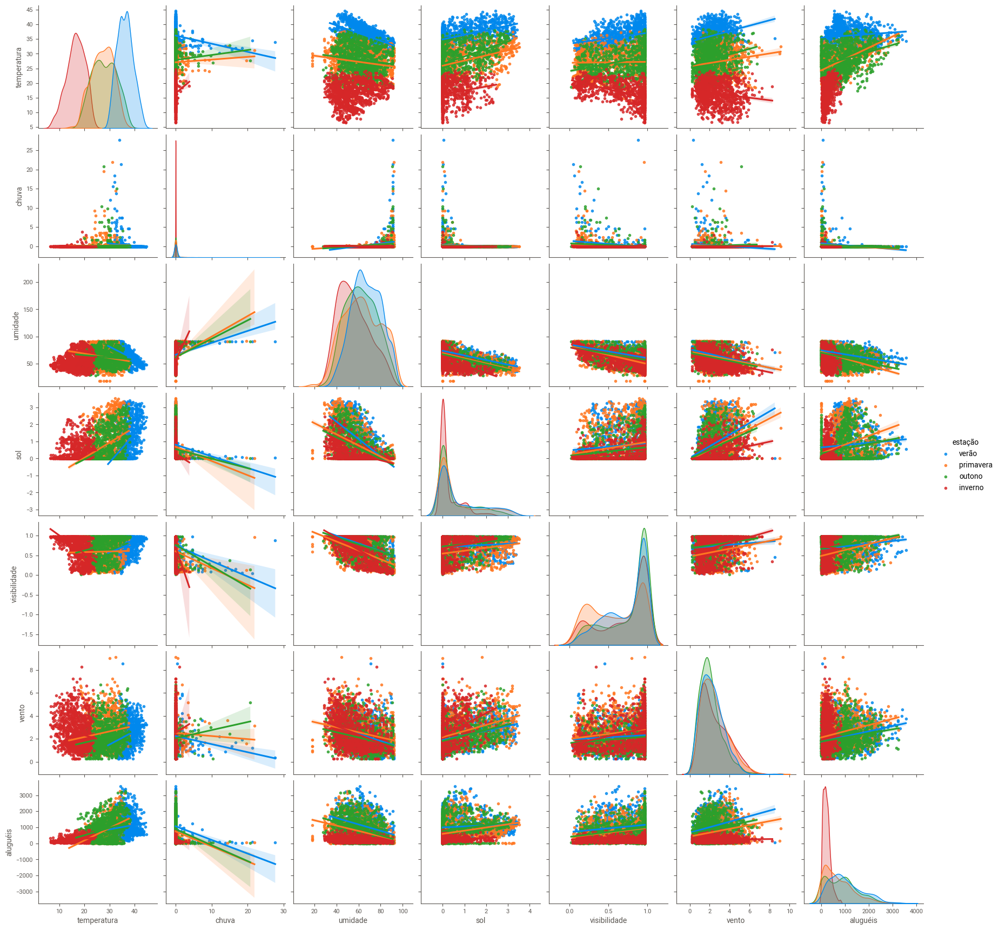

In [ ]:
col_num = ['temperatura', 'chuva', 'umidade', 'sol', 'visibilidade', 'vento', 'aluguéis']
sns.pairplot(treino,
             x_vars = col_num,
             y_vars = col_num,
             hue = 'estação',
             kind='reg')

### Analisando a variável target `aluguéis`

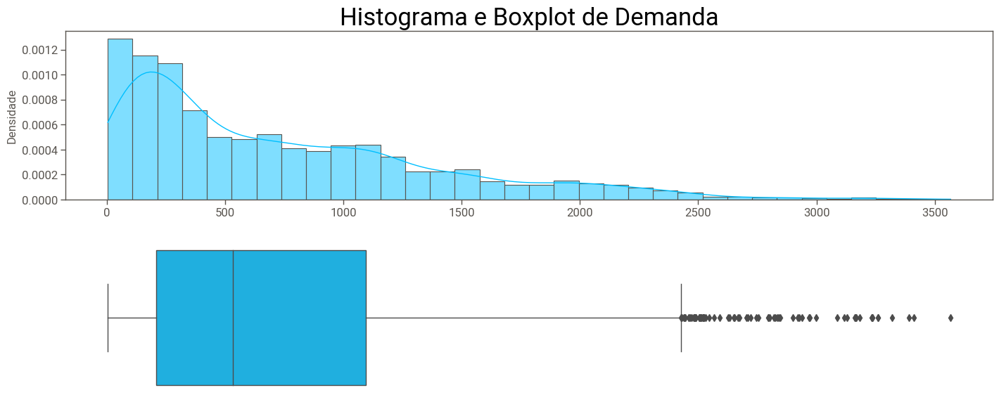

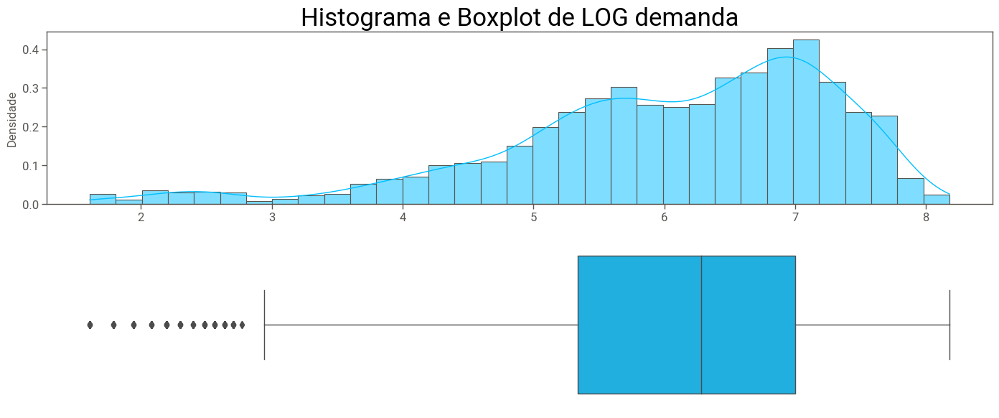

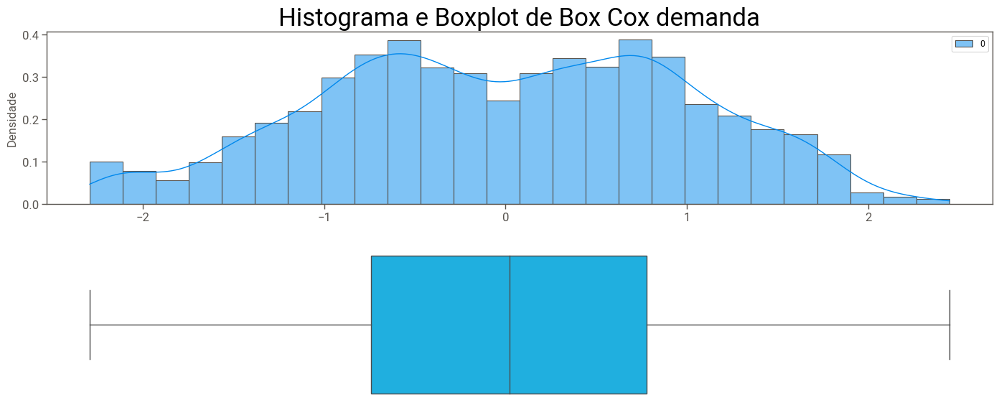

In [ ]:
from matplotlib.gridspec import GridSpec

def distribution_plot(column, title, color='deepskyblue'): 
    fig = plt.figure(figsize=(17, 7))
    grid = GridSpec(nrows=2, ncols=1, figure=fig)

    ax0 = fig.add_subplot(grid[0, :])
    ax0.set_title(f'Histograma e Boxplot de {title}', fontdict = {'fontsize':25})
    sns.histplot(column, ax=ax0, kde=True, 
                 stat="density", color=color, 
                )
    ax0.set(xlabel=None)
    ax0.set_ylabel('Densidade', size=12)
    ax0.tick_params(axis='y', labelsize= 12)
    ax0.tick_params(axis='x', labelsize= 12)

    ax1 = fig.add_subplot(grid[1, :])
    plt.axis('off')
    sns.boxplot(x=column, ax=ax1, color=color, 
               )

    
distribution_plot(treino['aluguéis'], 'Demanda')
distribution_plot(np.log(treino['aluguéis']), 'LOG demanda')

distribution_plot(PowerTransformer(method = 'box-cox').fit_transform(treino[['aluguéis']]), 'Box Cox demanda')


* Percebe-se que a função LOG deixou a distribuição com outliers invertidos em relação aos valores não transformados.
* Já, a BOX COX normalizou a distribuição

### Aluguéis no tempo

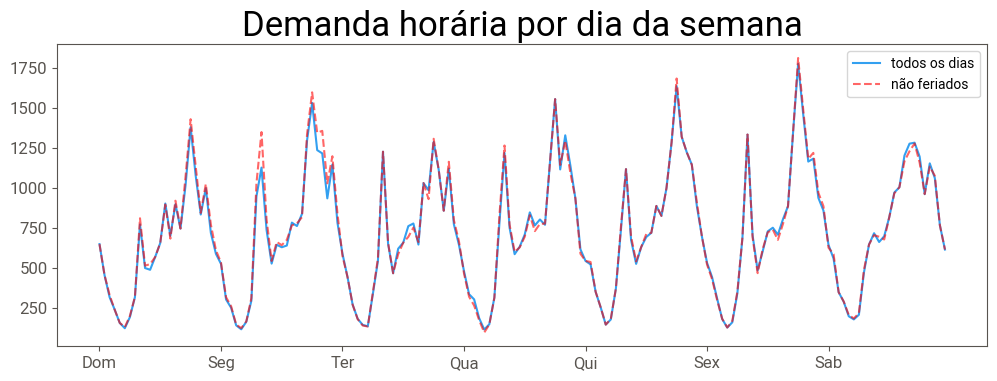

In [ ]:
fig, ax = plt.subplots(figsize=(12, 4))
average_week_demand = treino.groupby(['dia_num', 'hora'])['aluguéis'].mean()
average_week_demand.plot(ax=ax, alpha=0.8, label = 'todos os dias')
treino.loc[treino.feriado == 0].groupby(['dia_num', 'hora'])['aluguéis'].mean().plot(ax=ax, color='red',  linestyle='dashed', alpha=0.6, label = 'não feriados')

_ = ax.set(
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Dom", "Seg", "Ter", "Qua", "Qui", "Sex", "Sab"],

)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.title('Demanda horária por dia da semana', fontsize=25)
ax.set(xlabel=None)
#plt.ylabel('Aluguéis', fontsize=14)
plt.legend()
plt.show()

* Observa-se que o pico de fds é diferente do pico em dia útil: Não existe um pico da manha tão evidente

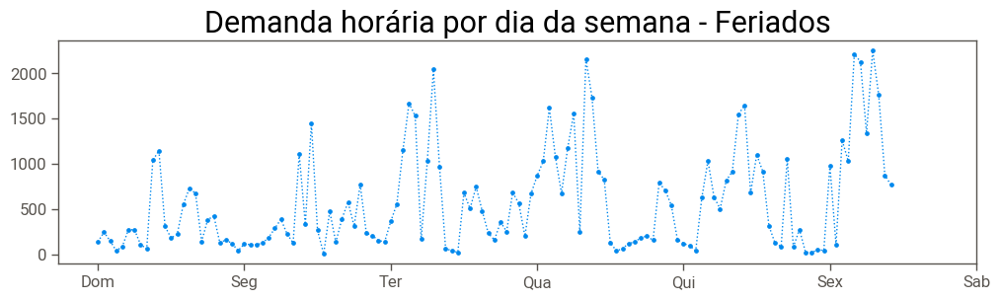

In [ ]:
# em feriados
fig, ax = plt.subplots(figsize=(12, 3))
treino.loc[treino.feriado == 1].groupby(['dia_num', 'hora'])['aluguéis'].mean().plot(linestyle='dotted', marker = '.', ax=ax) 
_ = ax.set(
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Dom", "Seg", "Ter", "Qua", "Qui", "Sex", "Sab"],

)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.title('Demanda horária por dia da semana - Feriados', fontsize=22)
ax.set(xlabel=None)

plt.show()

* Observa-se poucos pontos para poder chegar a uma conclusão qt aos dados de feriado

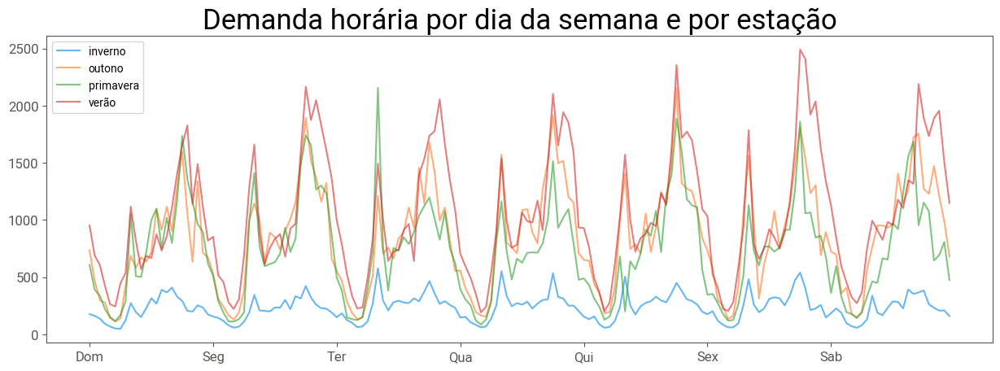

In [ ]:
fig, ax = plt.subplots(figsize=(12, 4))
treino.groupby(['dia_num', 'hora', 'estação'])['aluguéis'].mean().unstack().plot(figsize=(15,5), alpha = 0.6, ax=ax)

_ = ax.set(
    xticks=[i * 24 for i in range(7)],
    xticklabels=["Dom", "Seg", "Ter", "Qua", "Qui", "Sex", "Sab"],

)
plt.yticks(fontsize=12)
plt.xticks(fontsize=12)
plt.title('Demanda horária por dia da semana e por estação', fontsize=25)
ax.set(xlabel=None)
#plt.ylabel('Aluguéis', fontsize=14)
plt.legend()
plt.show()

* comparando as estações do ano, nota-se uma diferença no gráfico de aluguéis horários/diários

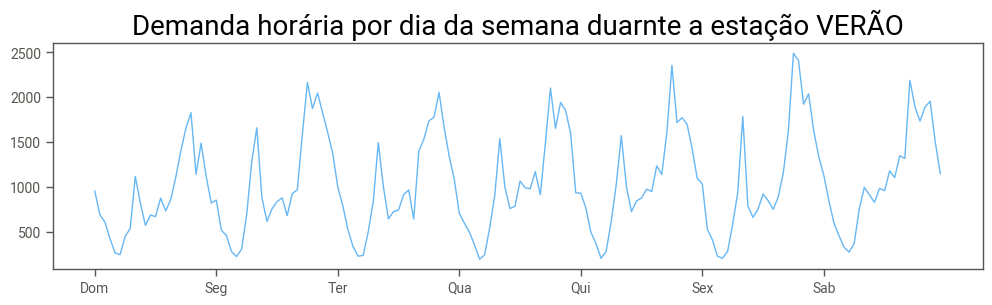

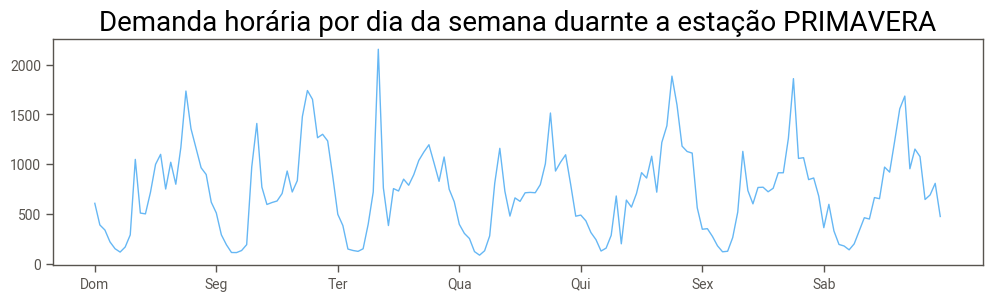

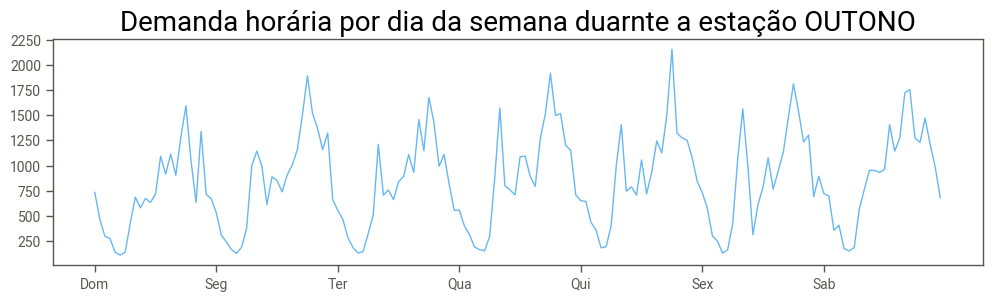

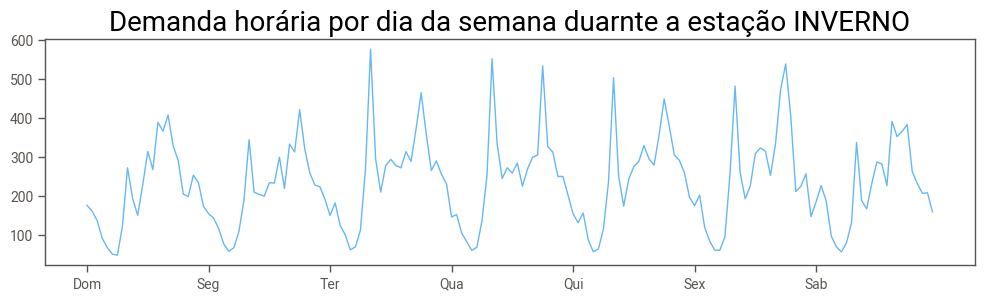

In [ ]:
for estacao in treino['estação'].unique():
    
    fig, ax = plt.subplots(figsize=(12, 3))
    treino.loc[treino['estação'] == estacao].groupby(['dia_num', 'hora'])['aluguéis'].mean().plot(ax=ax, alpha=0.6)

    _ = ax.set(
        xticks=[i * 24 for i in range(7)],
        xticklabels=["Dom", "Seg", "Ter", "Qua", "Qui", "Sex", "Sab"],

    )
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)
    plt.title('Demanda horária por dia da semana duarnte a estação {}'.format(estacao.upper()), fontsize=20)
    ax.set(xlabel=None)
    #plt.ylabel('Aluguéis', fontsize=14)

    plt.show()

* Nota-se um pico matutino maior na terça quando a estação é primavera
* Já em outono, o pico de tarde na quinta se destaca
* Percebe-se um comportamento diferente para a estação inverno, especialmente nos fds

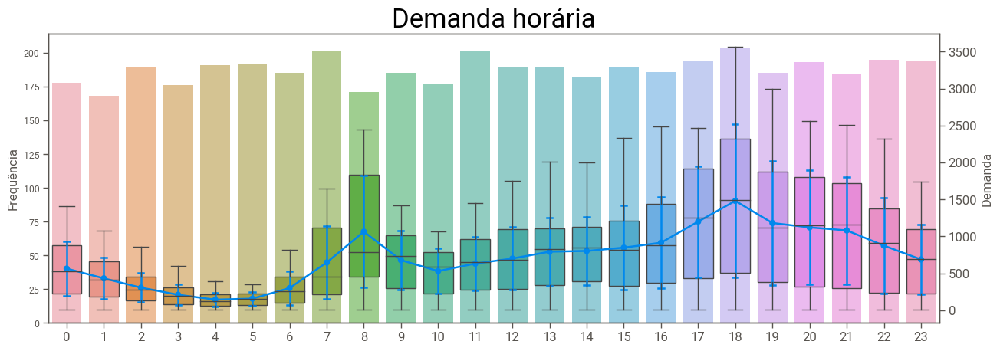

In [ ]:
def hora_plot_box(data, color = 'darkcyan', hue = None): 
    
    col_name = 'hora'

    ax1 = sns.set_style(style=None, rc=None)
    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title('Demanda horária', fontsize=25) 
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)

    ax1.tick_params(axis='x', labelsize= 12)

    ax2 = ax1.twinx()
    paper_rc = {'lines.linewidth': 1}                  
    sns.set_context("paper", rc = paper_rc) 
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.15, data=data, hue=hue, row=hue, ax = ax2, alpha=0.7,
                  ci='sd' # barra de erro com 1 desvio padrão para cada lado
                 ) 
    sns.boxplot(x=col_name,y="aluguéis",data=data, ax = ax2)
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)

    plt.show()
    
    
    
hora_plot_box(treino)



Possível categorização para horas de acordo com a demanda
* 23-0
* 1-6
* 7-9
* 10-12
* 13-16
* 17-19
* 20-22

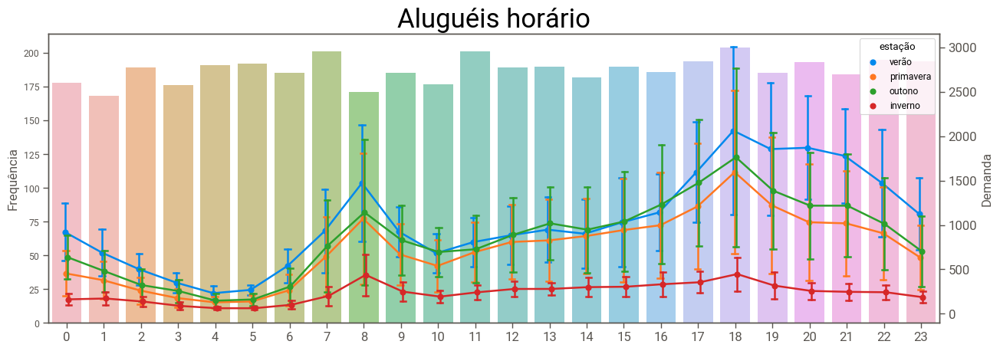

In [ ]:
def hora_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'hora'

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title('Aluguéis horário', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    

    ax2 = ax1.twinx()
    paper_rc = {'lines.linewidth': 1}                  
    sns.set_context("paper", rc = paper_rc) 
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.15, data=data, hue=hue, row=hue, ax = ax2,ci='sd'
                 ) 
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)
    
hora_plot(treino, hue = 'estação')

VERÃO


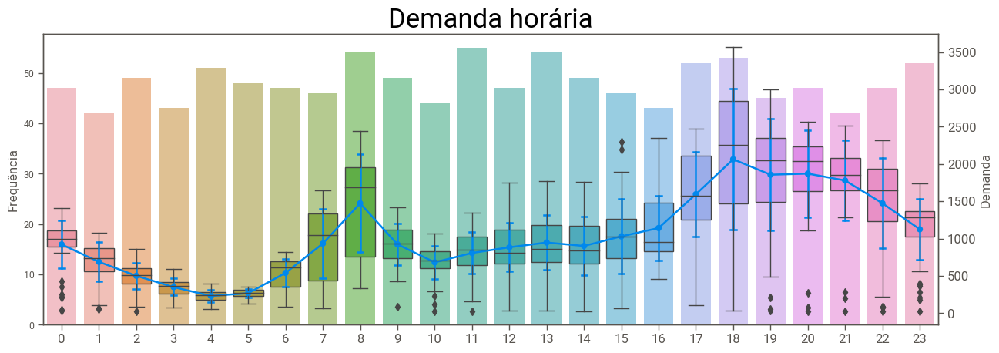

PRIMAVERA


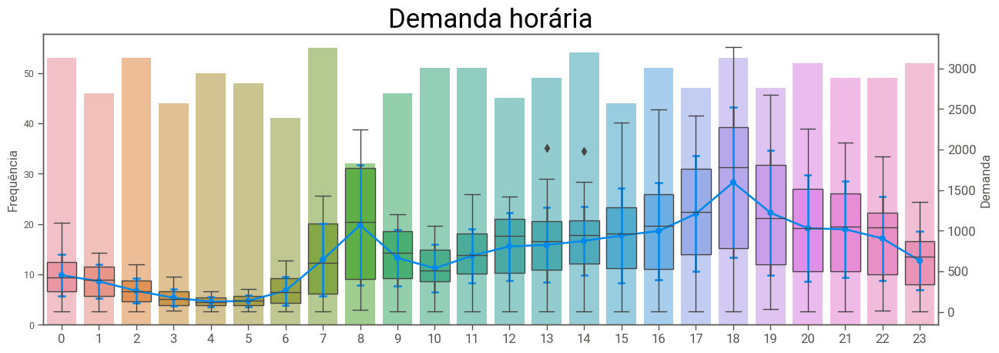

OUTONO


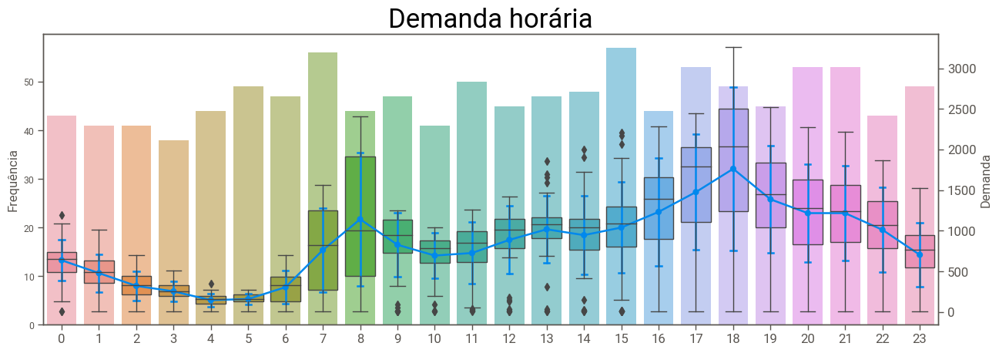

INVERNO


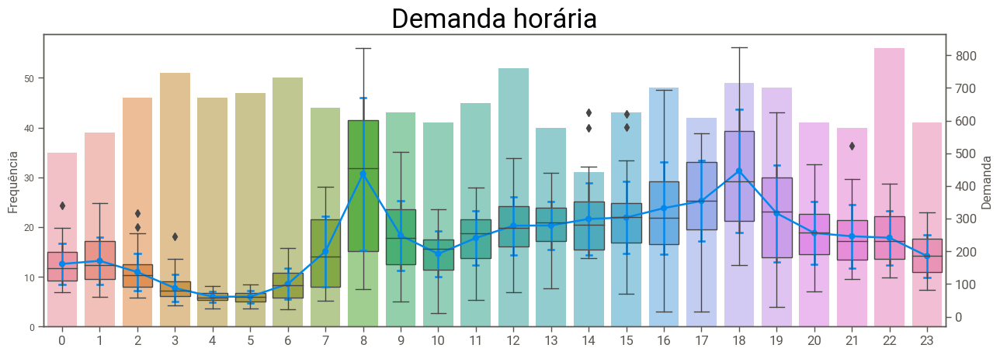

In [ ]:
for estacao in treino['estação'].unique():
    print('\033[1m' + '\033[95m' + estacao.upper())
    hora_plot_box(treino.loc[treino['estação'] == estacao])

* Nota-se que no inverno o pico da manha é quase igual ao da tarde enquanto que nas outras estações há uma diferença considerável

1
2
3
4
5
6
7


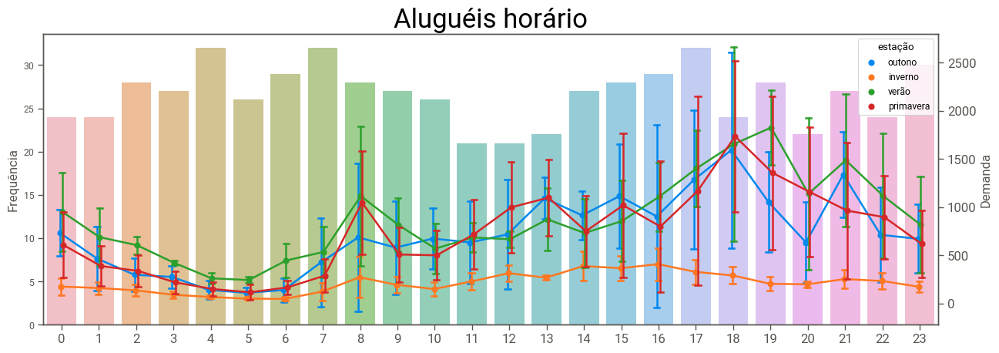

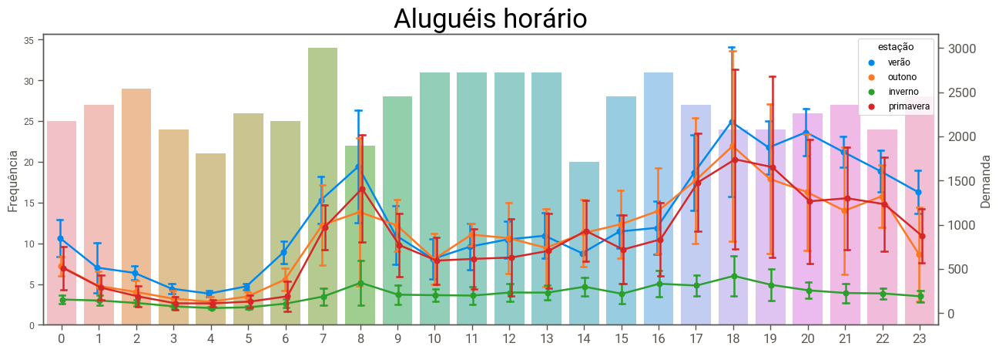

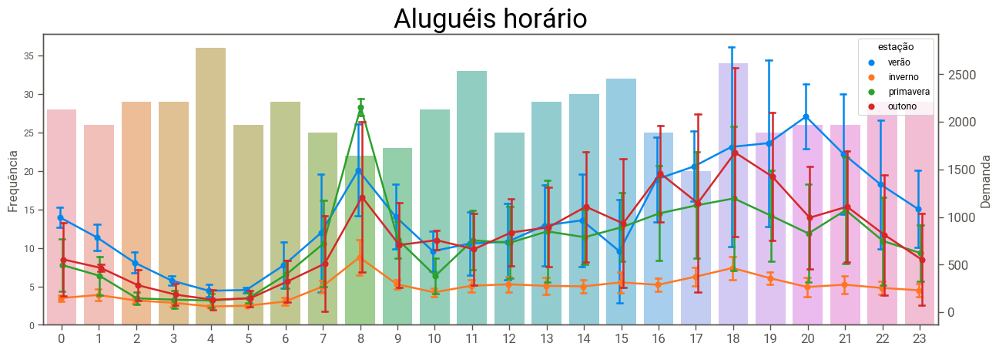

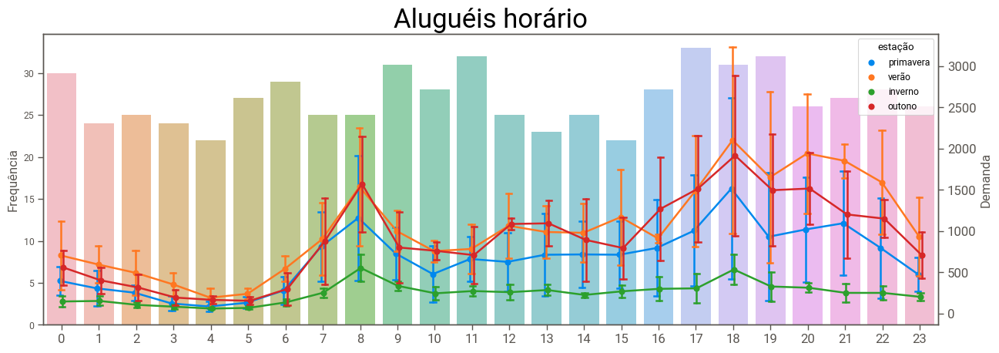

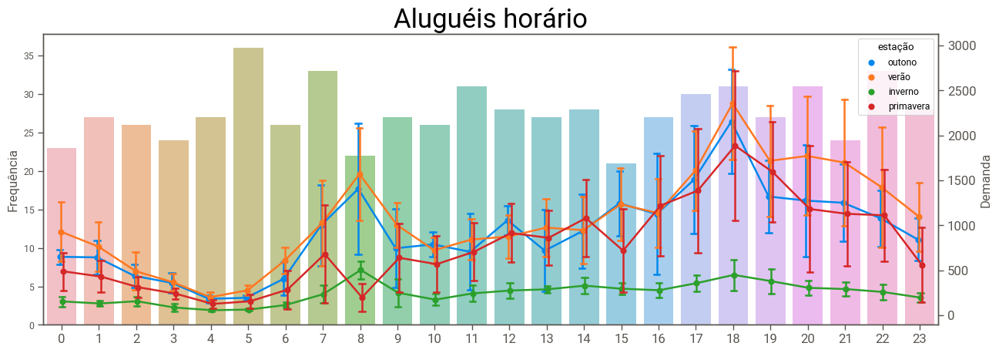

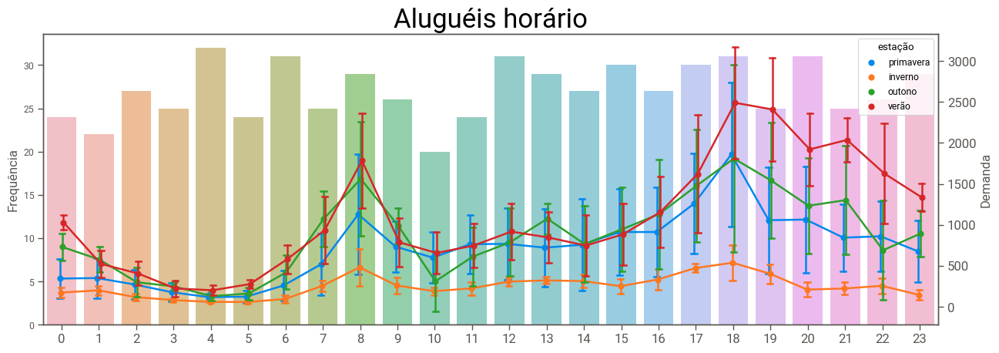

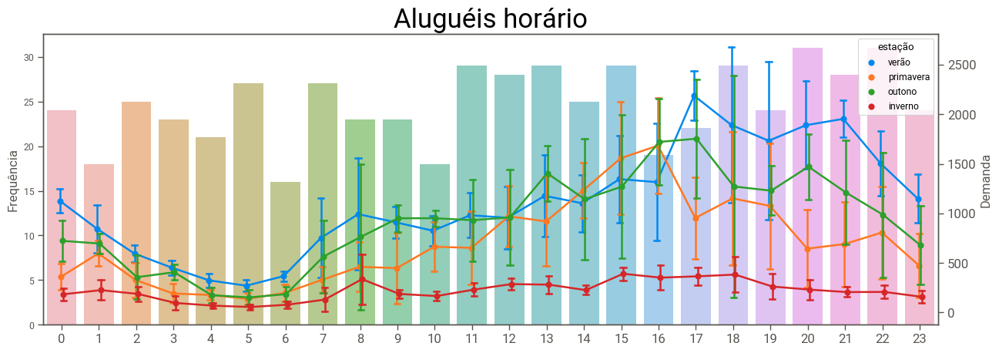

In [ ]:
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)
    
    hora_plot(treino.loc[treino['dia_num'] == dia], hue='estação')


1


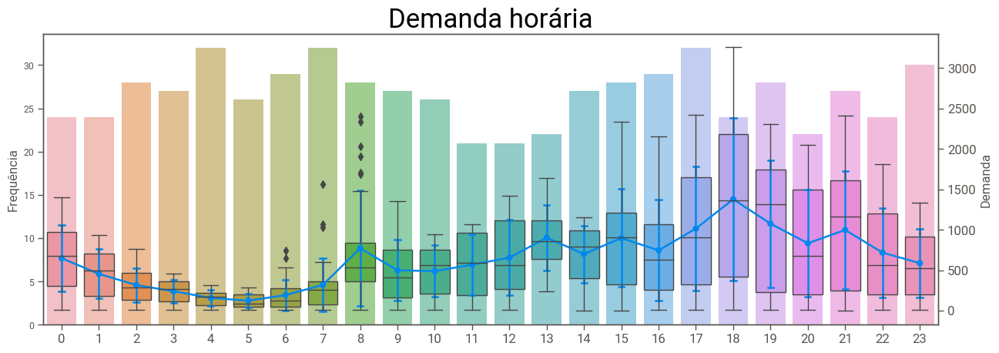

2


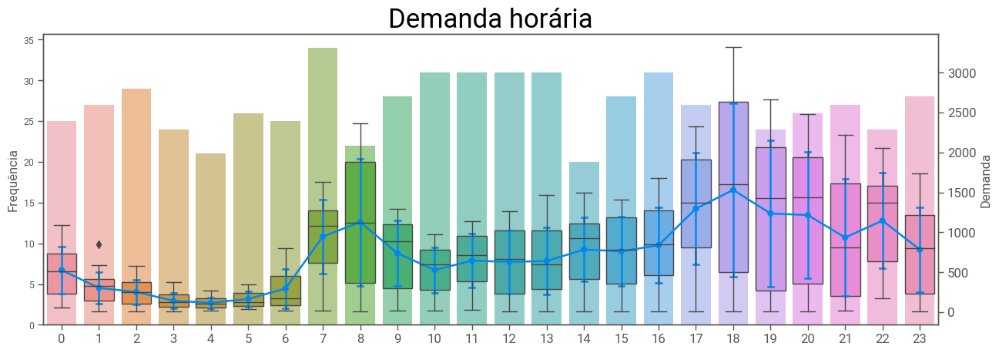

3


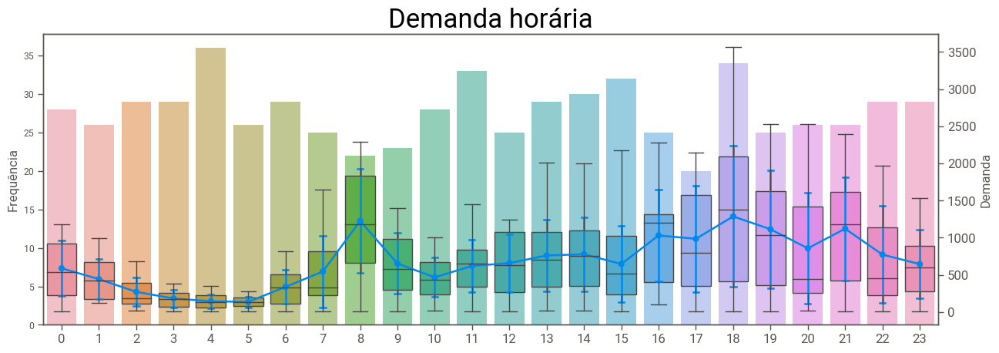

4


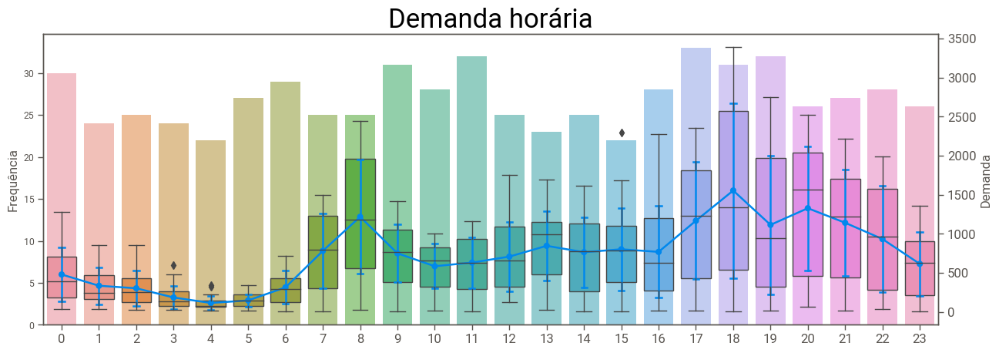

5


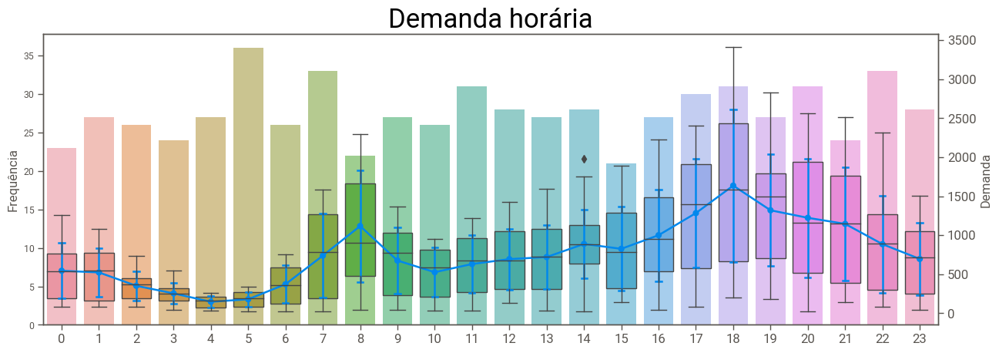

6


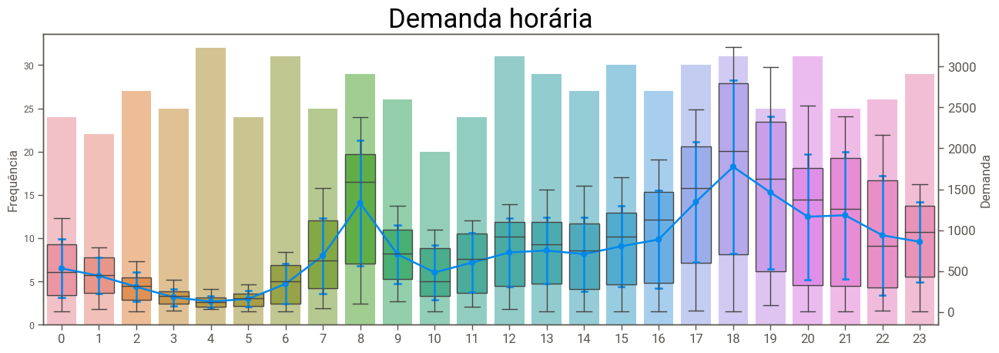

7


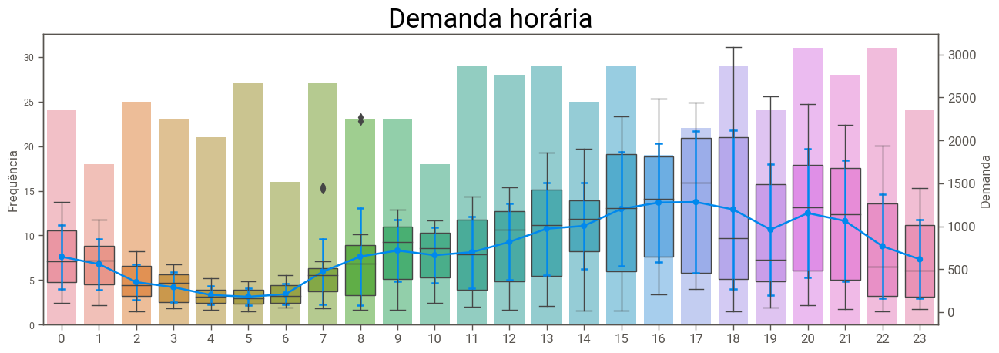

In [ ]:
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)
    hora_plot_box(treino.loc[treino['dia_num'] == dia],)

VERÃO
1


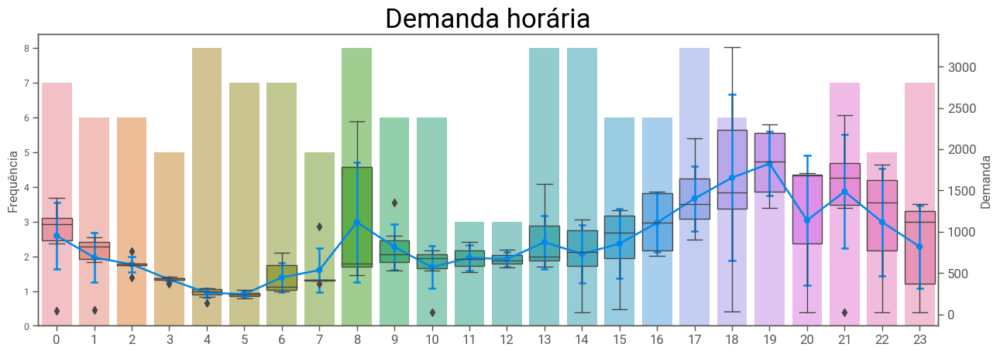

2


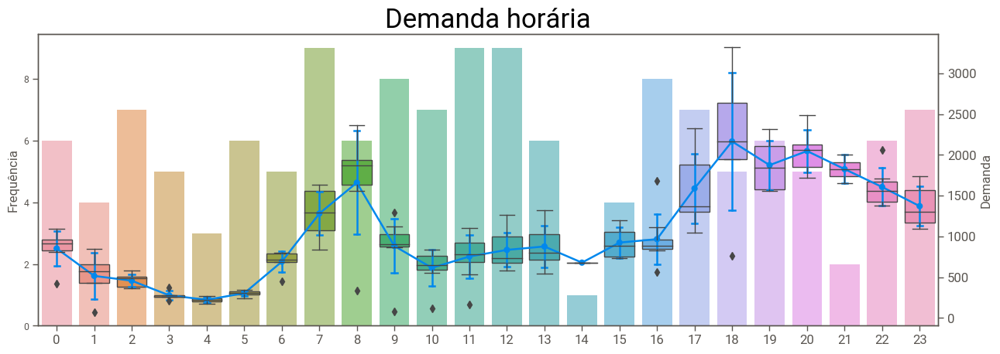

3


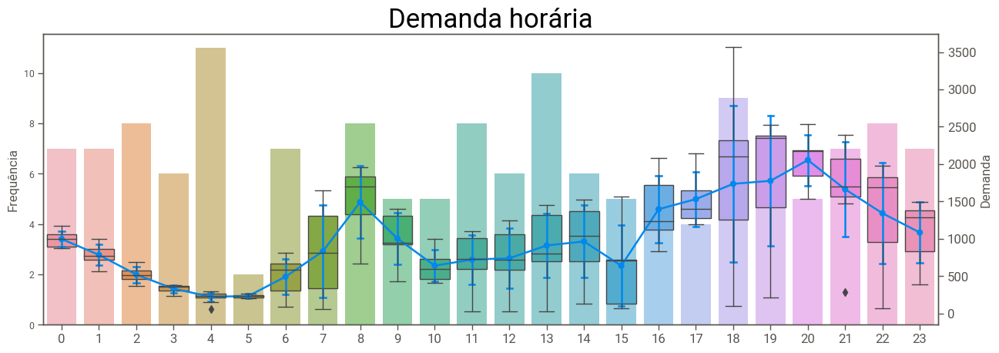

4


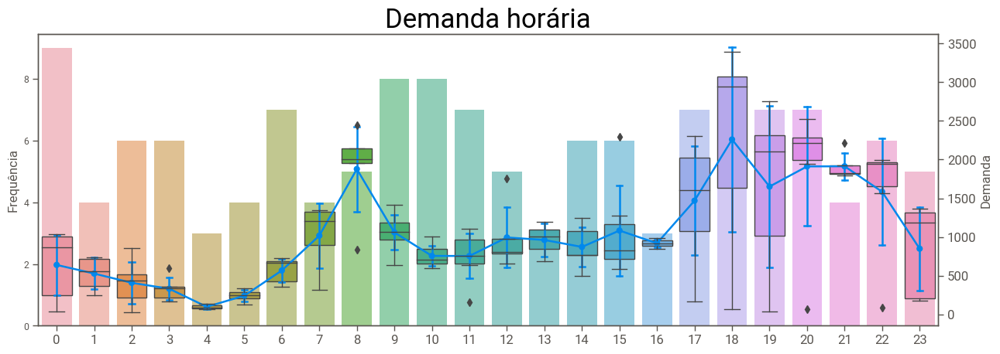

5


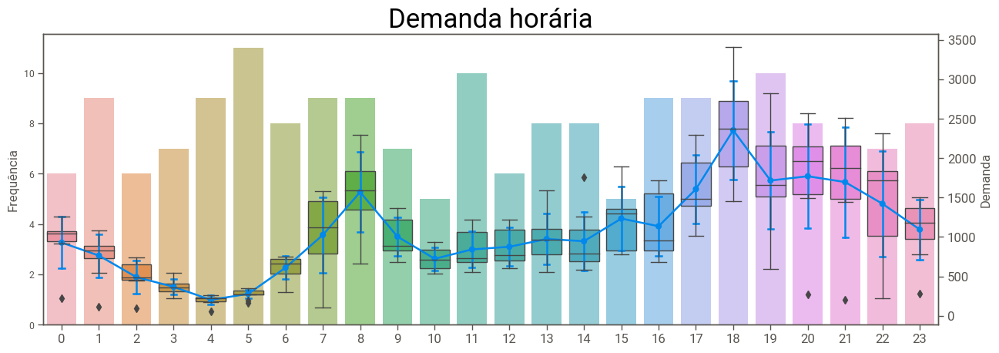

6


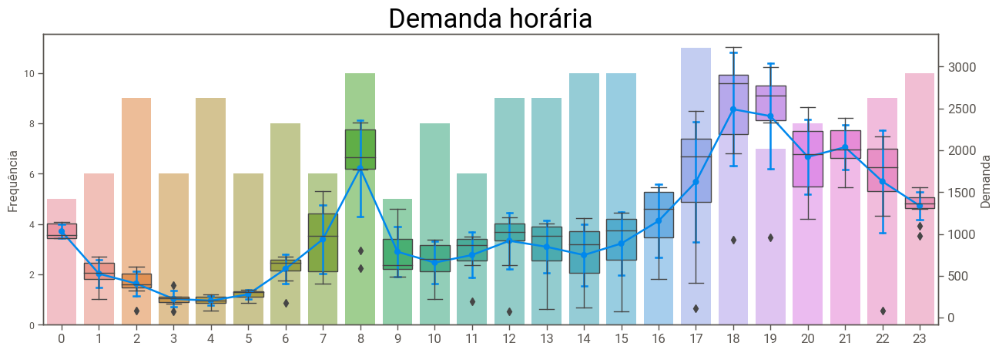

7


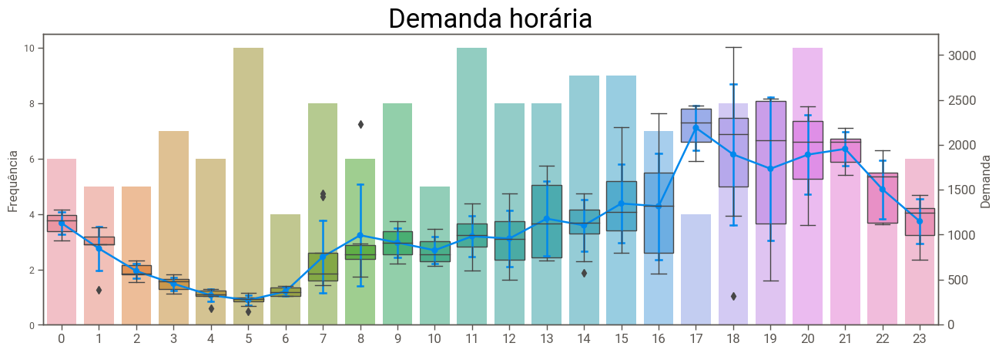

In [ ]:
print('VERÃO')
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)

    hora_plot_box(treino.loc[(treino['dia_num'] == dia) & (treino['estação'] == 'verão') & (treino.feriado == 0)])


    

    

OUTONO
1


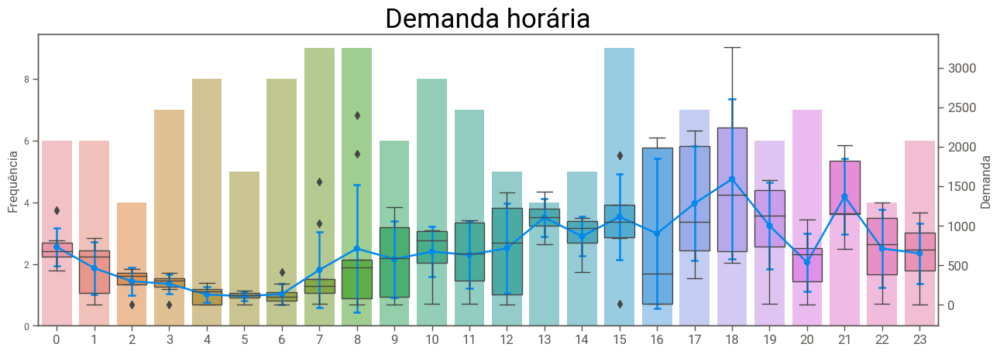

2


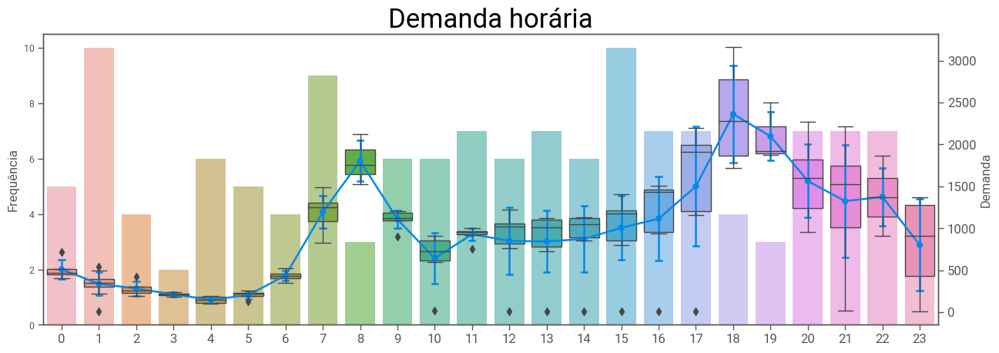

3


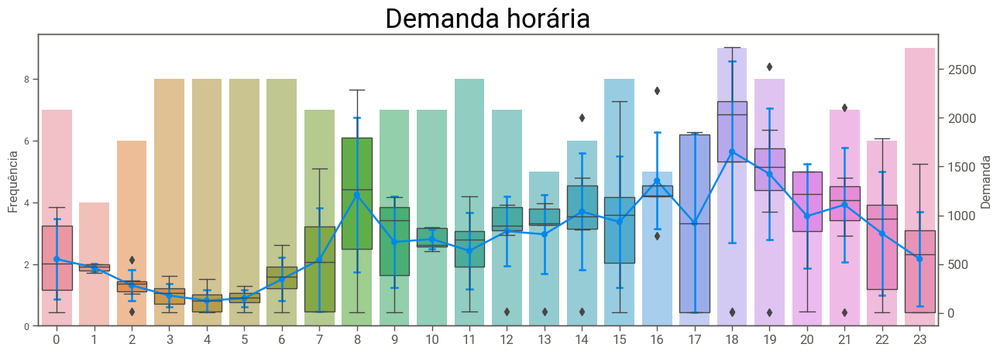

4


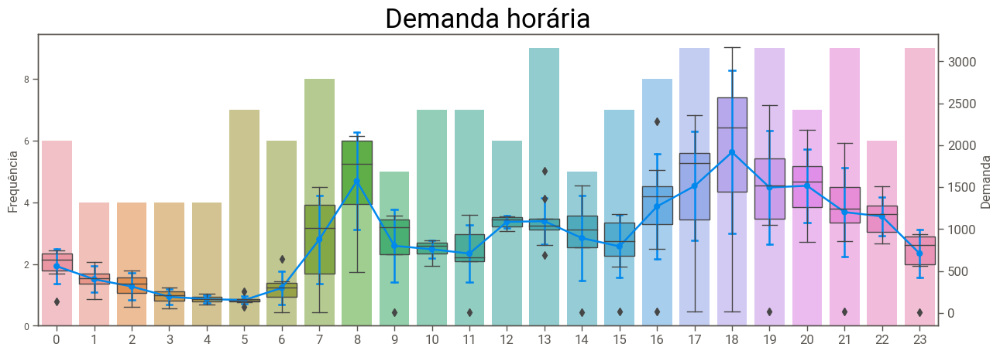

5


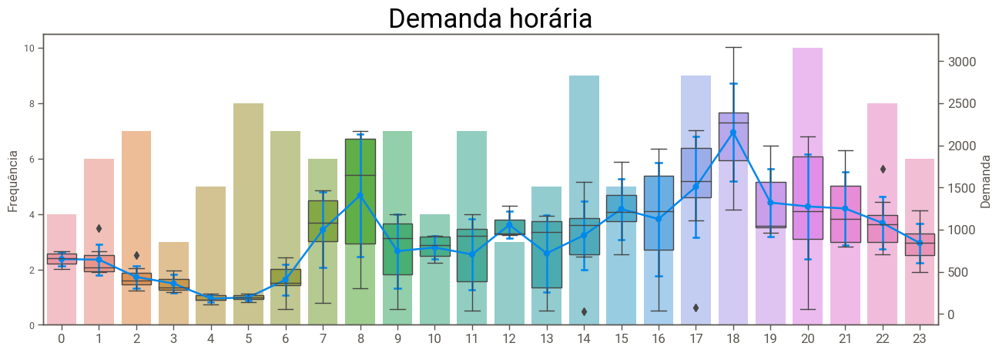

6


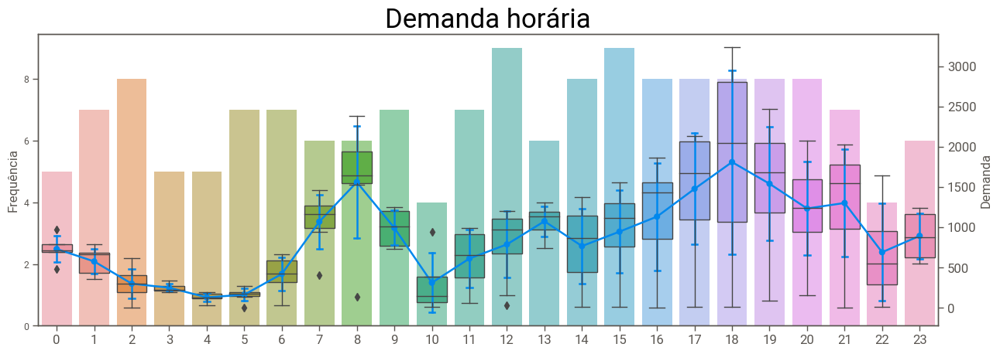

7


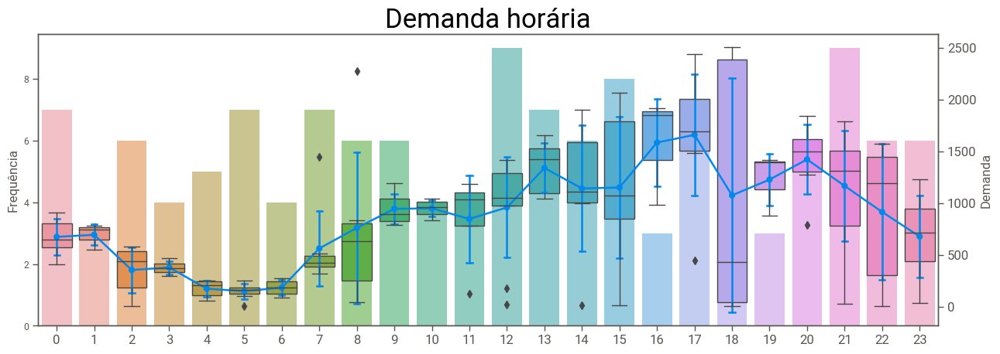

In [ ]:
print('OUTONO')  
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)
      
    hora_plot_box(treino.loc[(treino['dia_num'] == dia) & (treino['estação'] == 'outono') & (treino.feriado == 0)])



PRIMAVERA
1


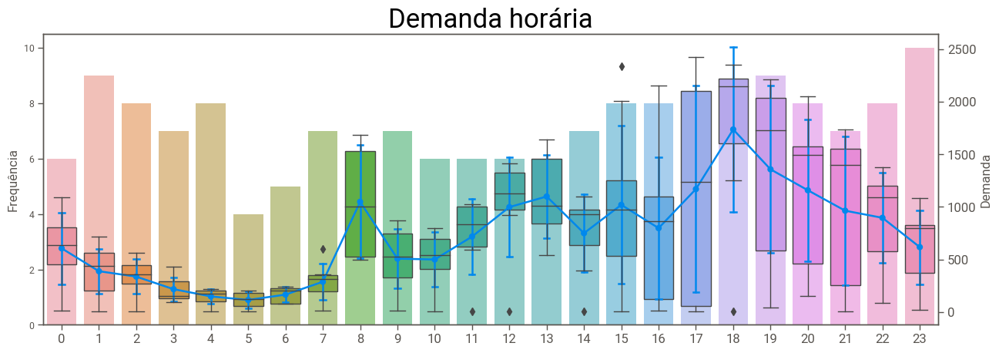

2


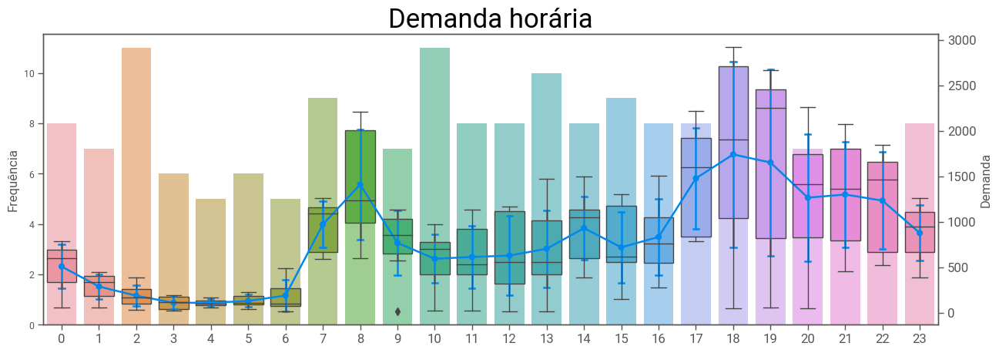

3


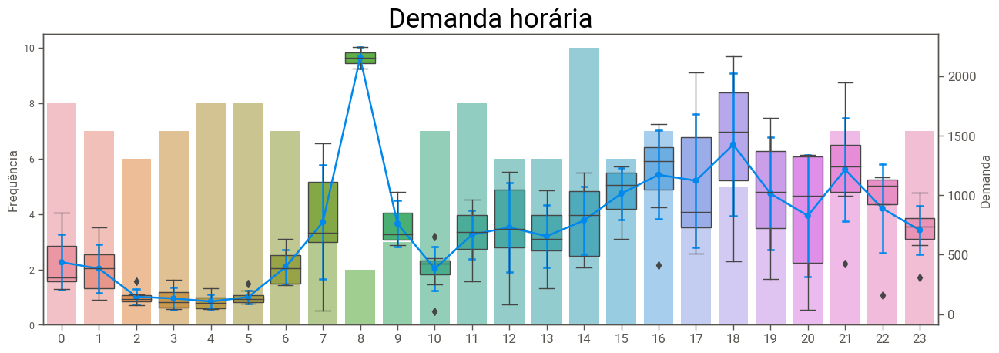

4


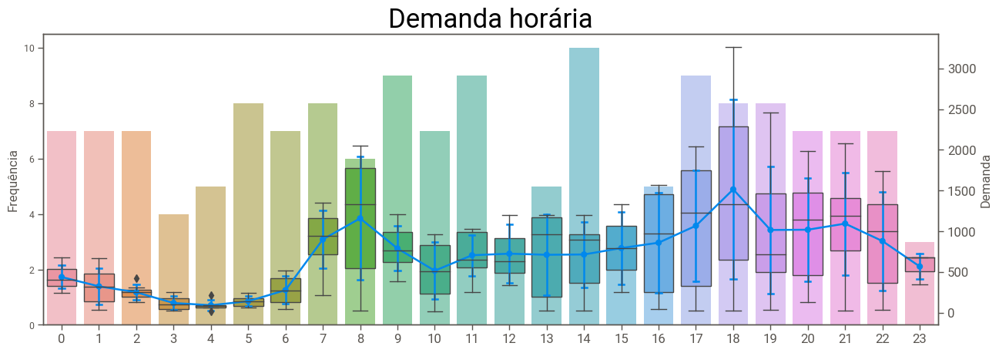

5


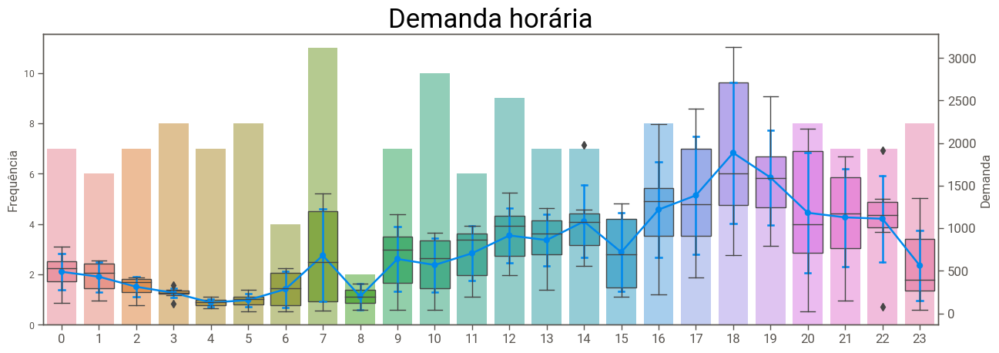

6


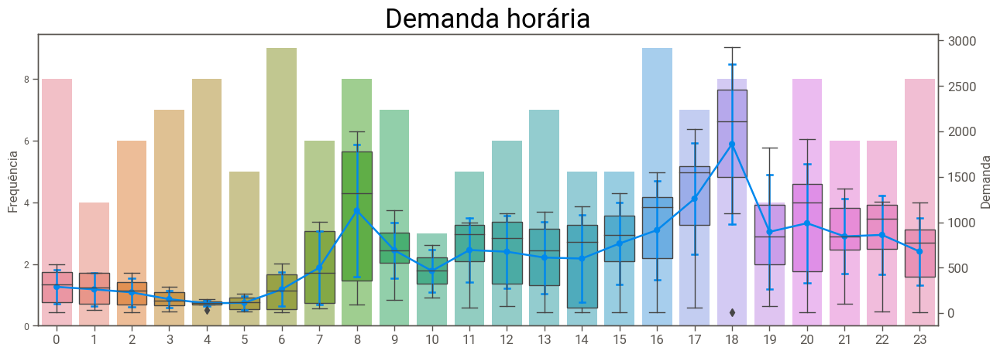

7


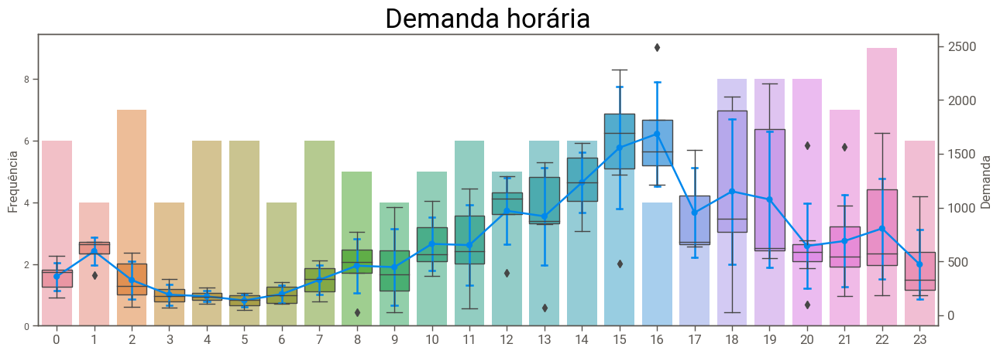

In [ ]:
print('PRIMAVERA')
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)
    
    hora_plot_box(treino.loc[(treino['dia_num'] == dia) & (treino['estação'] == 'primavera') & (treino.feriado == 0)])



INVERNO
1


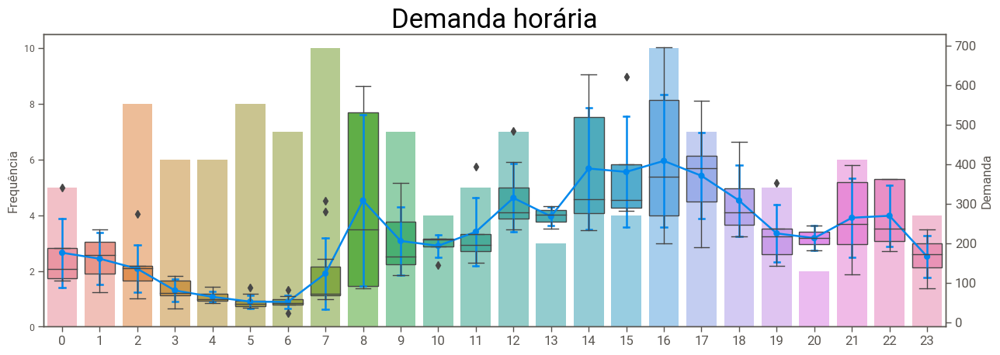

2


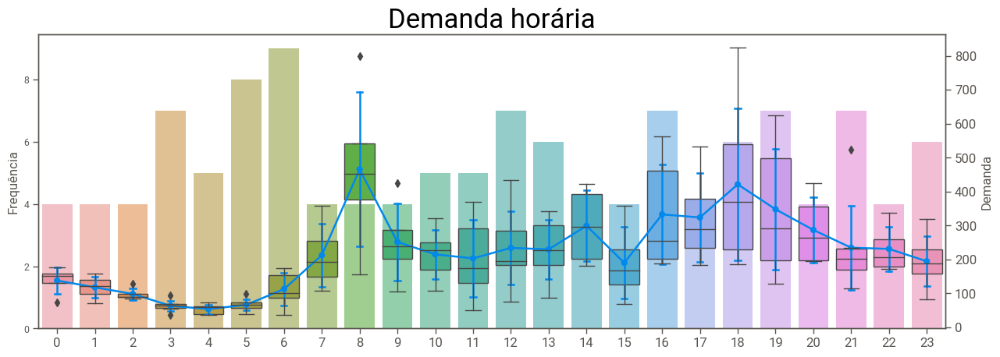

3


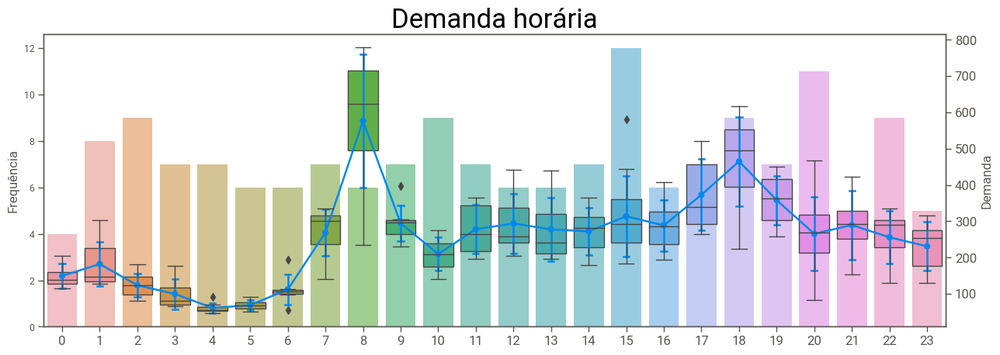

4


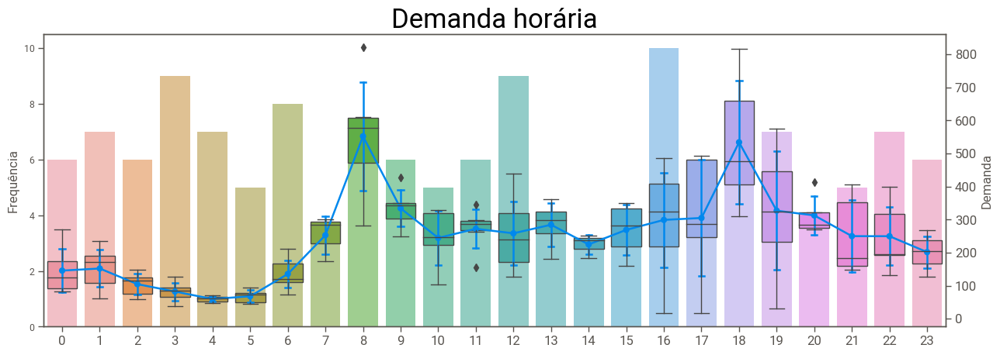

5


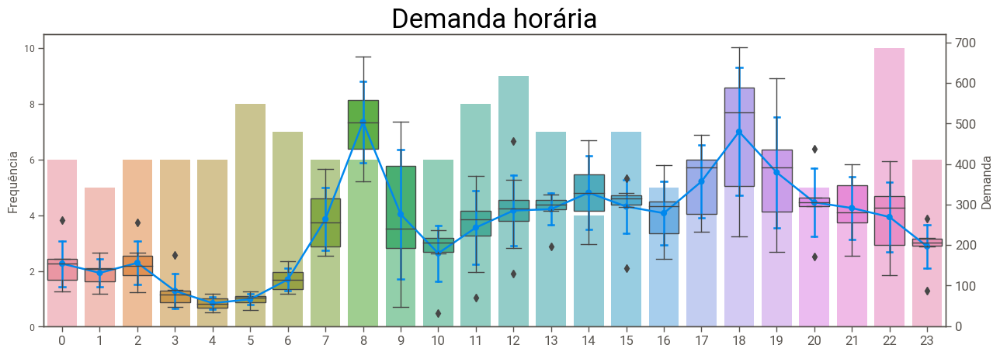

6


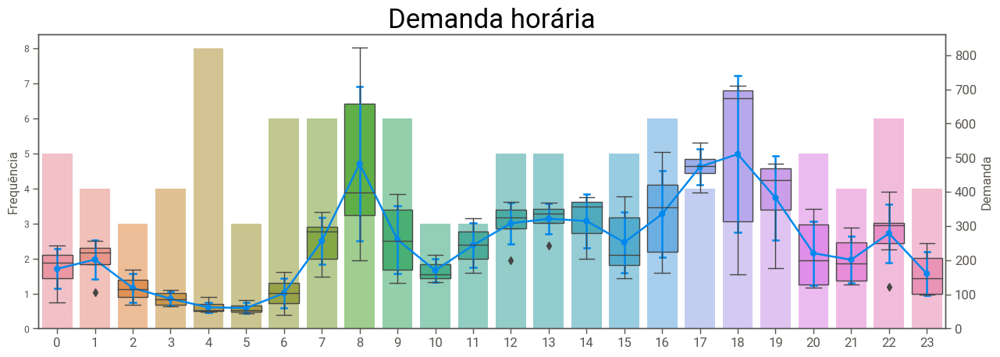

7


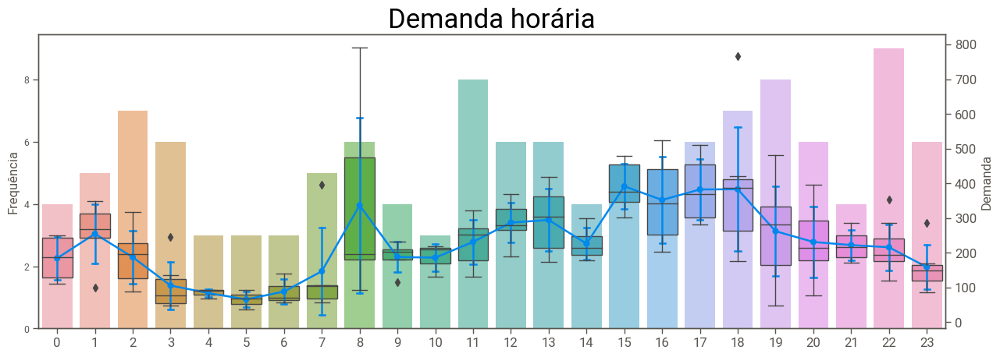

In [ ]:
print('INVERNO')
for dia in np.sort(treino['dia_num'].unique()):
    print(dia)
    
    hora_plot_box(treino.loc[(treino['dia_num'] == dia) & (treino['estação'] == 'inverno') & (treino.feriado == 0)])

* Conforme foi percebido no outro gráfico, na terça-feira o pico da manhã se destaca quando a estação é primavera, sendo que nesta estação o pico da manhã é maior que o da parte da tarde na terça. 
* Entretanto, por se tratar apenas de 2 dados, não é possível chegar a uma conclusão mas existe a possibilidade de serem outliers
* Investigando esse fato: 

In [ ]:
treino.loc[(treino['estação'] == 'primavera') & (treino.dia_num == 3) & (treino.hora == 8)]

,hora,dia,feriado,estação,temperatura,chuva,umidade,sol,visibilidade,vento,aluguéis,dia_num
1209,8,terça,0,primavera,32.0,0.0,67.9,0.34,0.52,2.29,2246,3
2618,8,terça,0,primavera,30.6,0.0,69.4,0.88,0.12,1.57,2066,3


In [ ]:
teste.loc[(teste['estação'] == 'primavera') & (teste.dia_num == 3) & (teste.hora == 8)]

,hora,dia,feriado,estação,temperatura,chuva,umidade,sol,visibilidade,vento,dia_num
518,8,terça,0,primavera,21.2,0.0,50.5,0.37,0.97,5.29,3
911,8,terça,0,primavera,25.3,0.0,77.7,0.29,0.97,1.81,3
1257,8,terça,0,primavera,20.1,0.0,65.6,0.14,0.90,2.17,3
1462,8,terça,0,primavera,24.1,0.0,55.0,0.68,0.74,1.21,3
1676,8,terça,0,primavera,24.3,0.0,54.3,0.69,0.70,1.57,3
1941,8,terça,0,primavera,28.5,2.3,91.2,0.08,0.20,1.45,3
1998,8,terça,1,primavera,30.5,0.0,65.6,1.00,0.84,1.21,3
2092,8,terça,0,primavera,19.0,0.0,91.2,0.22,0.07,1.33,3
2290,8,terça,0,primavera,23.9,0.0,91.2,0.01,0.07,0.97,3


### Aluguéis Vs `Estação`

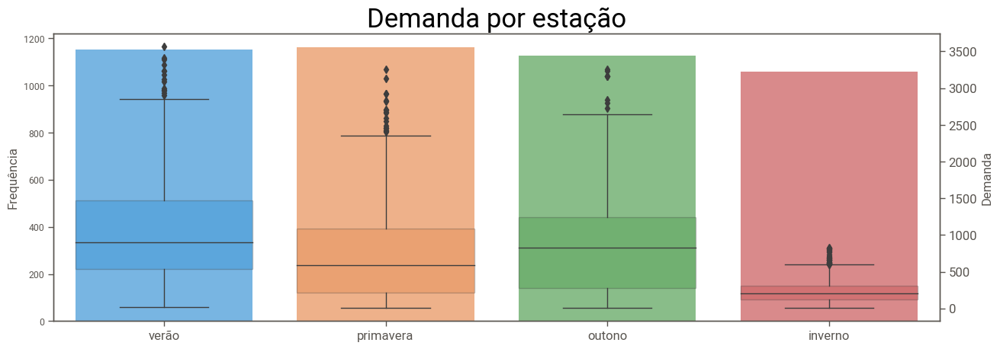

In [ ]:
ax1 = sns.set_style(style=None, rc=None)
fig, ax1 = plt.subplots(figsize=(15,5))
sns.countplot(x='estação', data=treino, ax = ax1, alpha=0.6) \
                 .set_title('Demanda por estação', fontsize=25)
ax1.set(xlabel=None)
ax1.set_ylabel('Frequência', size=12)
ax1.tick_params(axis='x', labelsize= 12)

    
ax2 = ax1.twinx()
paper_rc = {'lines.linewidth': 1}                  
sns.set_context("paper", rc = paper_rc) 
sns.boxplot(x='estação',y="aluguéis",data=treino, ax = ax2, boxprops=dict(alpha=.3))
ax2.set_ylabel('Demanda', size=12)
ax2.tick_params(axis='y', labelsize= 12)



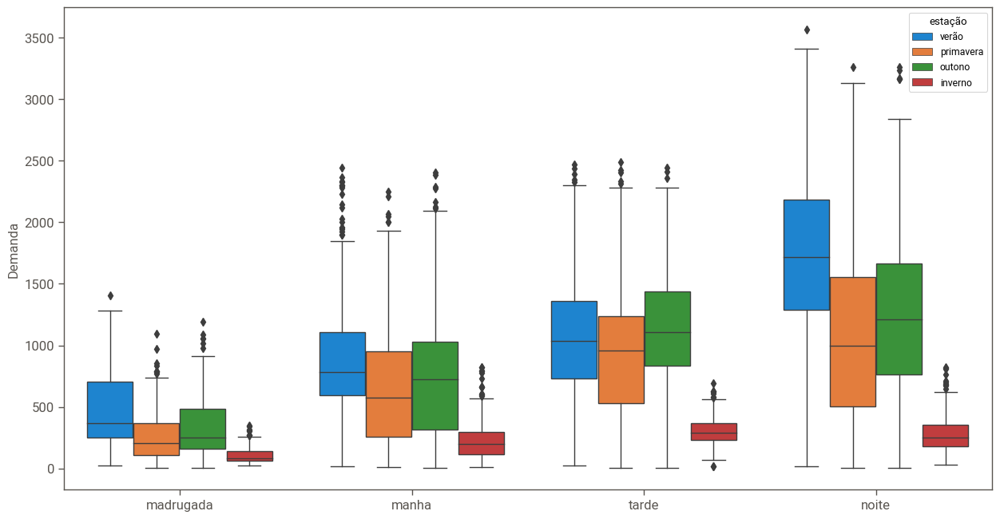

In [ ]:
def aux_periodo_dia(x):
    if x < 6:
        return 1 # madrugada
    elif x < 12:
        return 2 # manha
    elif x < 18:
        return 3 # tarde
    else:
        return 4 # noite

def dados_periodo_dia(df):
    df['periodo_dia'] = df.hora.map(aux_periodo_dia)
    return df    

treino['periodo_dia'] = treino.hora.map(aux_periodo_dia)
teste['periodo_dia'] = teste.hora.map(aux_periodo_dia)

#####################################################################################################


fig, ax1 = plt.subplots(figsize=(15,8))

sns.boxplot(data = treino, x = 'periodo_dia', y = 'aluguéis',
           hue= 'estação', ax=ax1)
ax1.set(xlabel=None)
ax1.set_ylabel('Demanda', size=12)
ax1.tick_params(axis='x', labelsize= 12)
ax1.tick_params(axis='y', labelsize= 12)
ax1.set(xticks=[i for i in range(4)],
        xticklabels = ['madrugada', 'manha', 'tarde', 'noite'])
plt.show()

* Observa-se que no período da tarde, a estação outono é que apresenta a maior mediana

### Aluguéis Vs `Feriado`

[[<matplotlib.axis.XTick at 0x210a50e10d0>,
 [Text(0, 0, 'Dia normal'), Text(1, 0, 'Feriado')]]

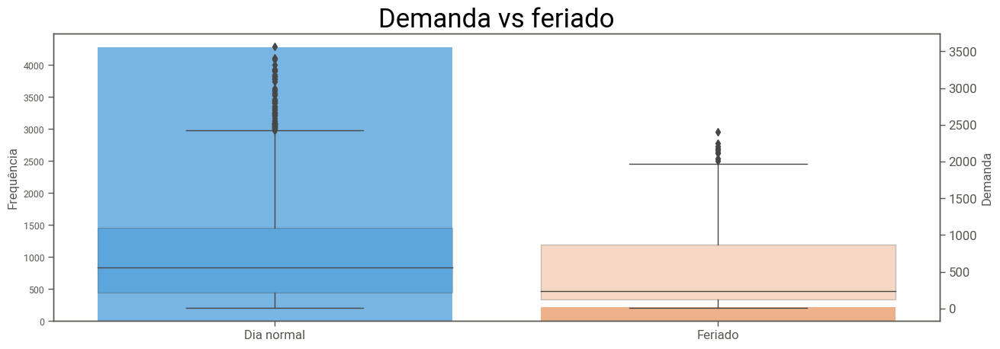

In [ ]:
ax1 = sns.set_style(style=None, rc=None)
fig, ax1 = plt.subplots(figsize=(15,5))
sns.countplot(x='feriado', data=treino, ax = ax1, alpha=0.6) \
                 .set_title('Demanda vs feriado', fontsize=25)
ax1.set(xlabel=None)
ax1.set_ylabel('Frequência', size=12)
ax1.tick_params(axis='x', labelsize= 12)

ax2 = ax1.twinx()
paper_rc = {'lines.linewidth': 1}                  
sns.set_context("paper", rc = paper_rc) 
sns.boxplot(x='feriado',y="aluguéis",data=treino, ax = ax2, boxprops=dict(alpha=.3))
ax2.set_ylabel('Demanda', size=12)
ax2.tick_params(axis='y', labelsize= 12)
ax1.set(xticks=[i for i in range(2)],
        xticklabels = ['Dia normal', 'Feriado'])




* Nota-se uma pequena quantidade de dados de feriado. Talvez seja de maior proveito ao modelo se esta variável fosse retirada

[[<matplotlib.axis.XTick at 0x210ae6d4130>,
 [Text(0, 0, 'Não útil'), Text(1, 0, 'Dia útil')]]

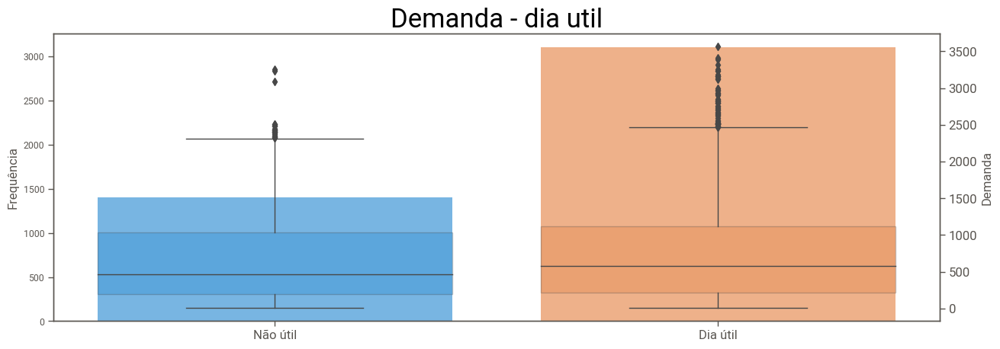

In [ ]:
def aux_dia_util(x):
    if (x['feriado'] == 1) or (x['dia_num'] == 1 or x['dia_num'] == 7):
        return 0
    else:
        return 1
    
def dados_dia_util(df):
    df['dia_util'] = df[['feriado', 'dia_num']].apply(aux_dia_util, axis = 1)   
    return df

df = treino.copy()
df = dados_dia_util(df)

####################################################################################################

ax1 = sns.set_style(style=None, rc=None)
fig, ax1 = plt.subplots(figsize=(15,5))
sns.countplot(x='dia_util', data=df, ax = ax1, alpha=0.6) \
                 .set_title('Demanda - dia util', fontsize=25)
ax1.set(xlabel=None)
ax1.set_ylabel('Frequência', size=12)
ax1.tick_params(axis='x', labelsize= 12)

ax2 = ax1.twinx()
paper_rc = {'lines.linewidth': 1}                  
sns.set_context("paper", rc = paper_rc) 
sns.boxplot(x='dia_util',y="aluguéis",data=df, ax = ax2, boxprops=dict(alpha=.3))
ax2.set_ylabel('Demanda', size=12)
ax2.tick_params(axis='y', labelsize= 12)
ax1.set(xticks=[i for i in range(2)],
        xticklabels = ['Não útil', 'Dia útil'])


### Aluguéis por dia da semana

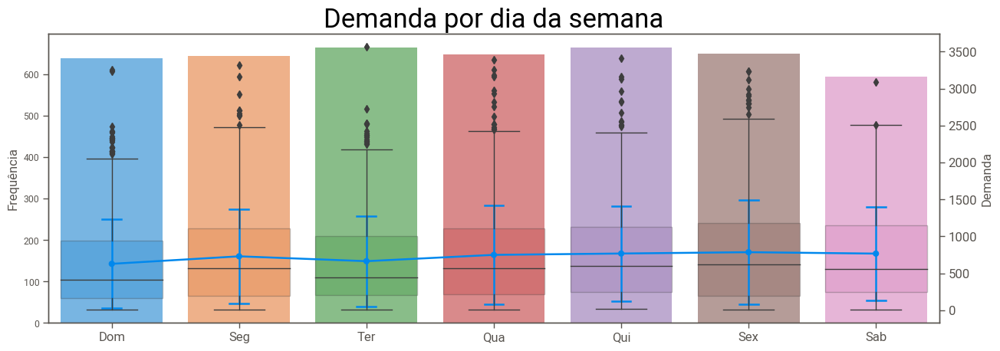

In [ ]:
ax1 = sns.set_style(style=None, rc=None)
fig, ax1 = plt.subplots(figsize=(15,5))
sns.countplot(x='dia_num', data=treino, ax = ax1, alpha=0.6) \
                 .set_title('Demanda por dia da semana', fontsize=25)
ax1.set(xlabel=None)
ax1.set_ylabel('Frequência', size=12)
ax1.tick_params(axis='x', labelsize= 12)

ax2 = ax1.twinx()
paper_rc = {'lines.linewidth': 1}                  
sns.set_context("paper", rc = paper_rc) 
sns.pointplot(x='dia_num', y='aluguéis',
                  dodge=0.1, capsize=.15, data=treino,ax = ax2, alpha=0.7,
                  ci='sd' # barra de erro com 1 desvio padrão para cada lado
                 ) 
sns.boxplot(x='dia_num',y="aluguéis",data=treino, ax = ax2, boxprops=dict(alpha=.3))
ax2.set_ylabel('Demanda', size=12)
ax2.tick_params(axis='y', labelsize= 12)
ax1.set(
        xticklabels = ['Dom', 'Seg', 'Ter', 'Qua', 'Qui', 'Sex', 'Sab'])

plt.show()


## `chuva`

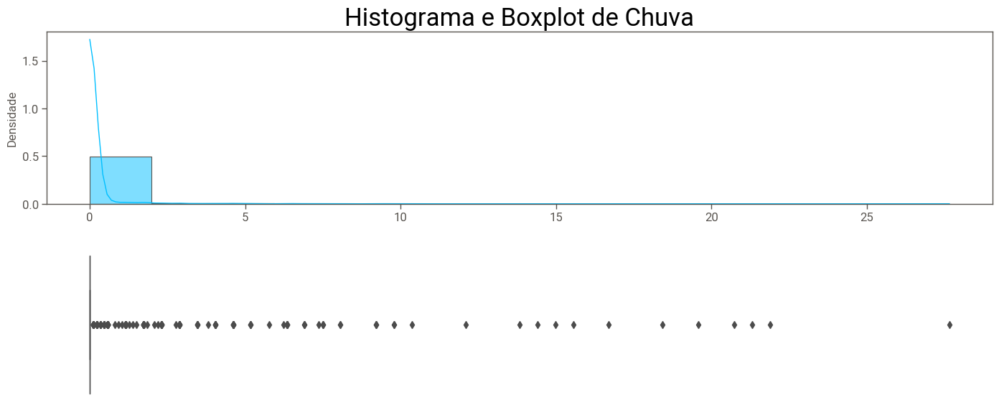

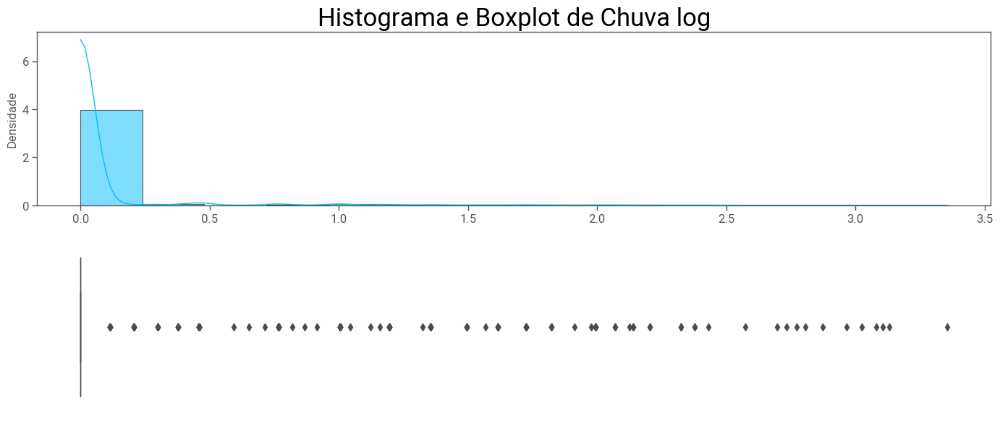

In [ ]:
distribution_plot(treino.chuva, 'Chuva', color='deepskyblue')

distribution_plot(np.log1p(treino.chuva), 'Chuva log')

<ipython-input-214-1beaa97151d9>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


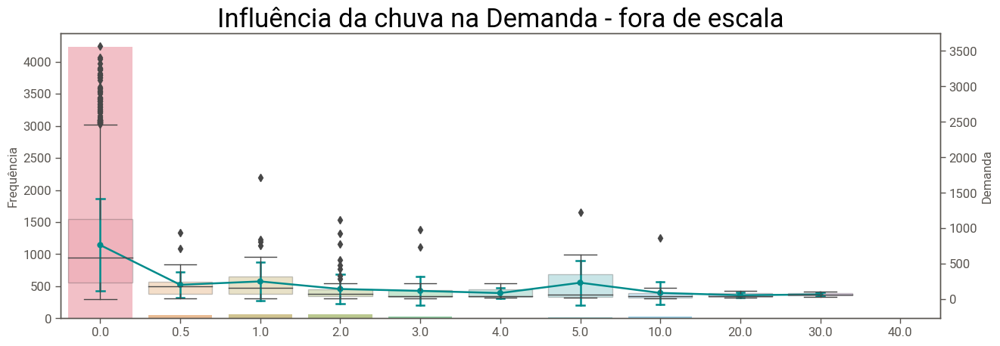

In [ ]:
def chuva_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'chuva'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[-1,0, 0.5,1, 2, 3, 4, 5,  10, 20, 30, 40 ],
                               labels=[0,0.5, 1, 2, 3, 4,  5, 10, 20, 30, 40 ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência da {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3))
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  
    
    
    
chuva_plot(treino)

<ipython-input-216-6f58dfeecbf8>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


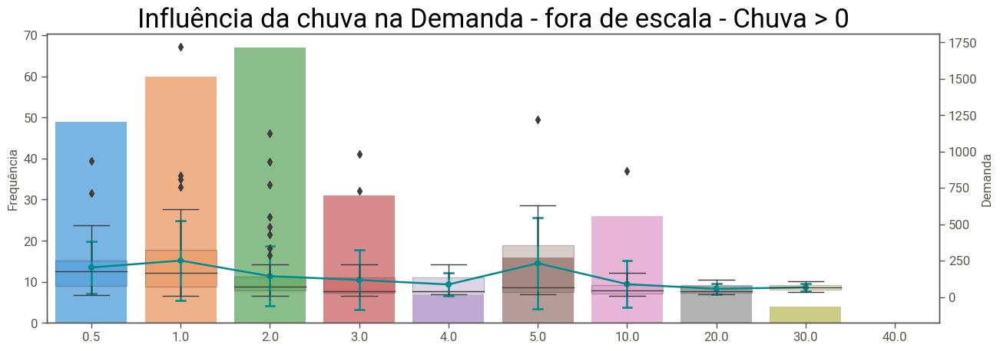

In [ ]:
def chuva_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'chuva'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[0, 0.5,1, 2, 3, 4, 5,  10, 20, 30, 40 ],
                               labels=[0.5, 1, 2, 3, 4,  5, 10, 20, 30, 40 ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))
    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência da {col_name} na Demanda - fora de escala - Chuva > 0', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3))
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
chuva_plot(treino)

* Nota-se que a grande maioria dos dados a chuva é zero;
* E nem a escala log conseguiu melhorar a distribuição dos dados;
* Dessa forma, seguindo os gráficos acima, podemos separar chuva em chuva =0 e chuva > 0

## `sol`

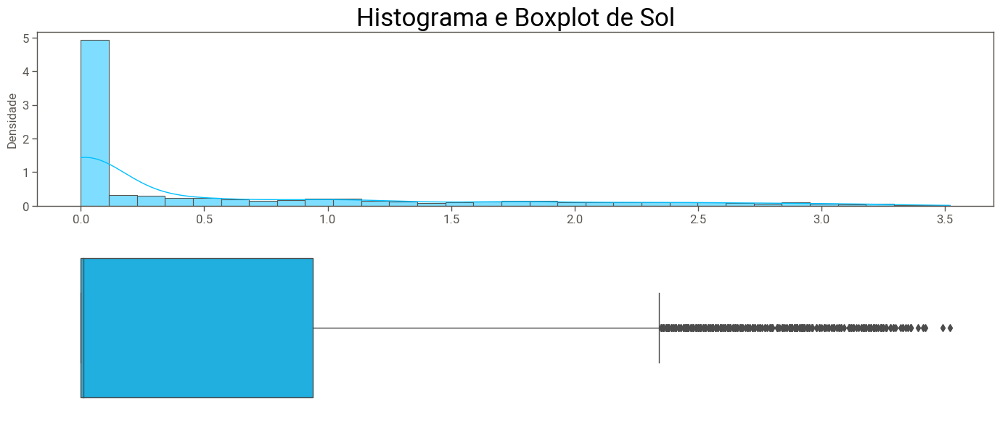

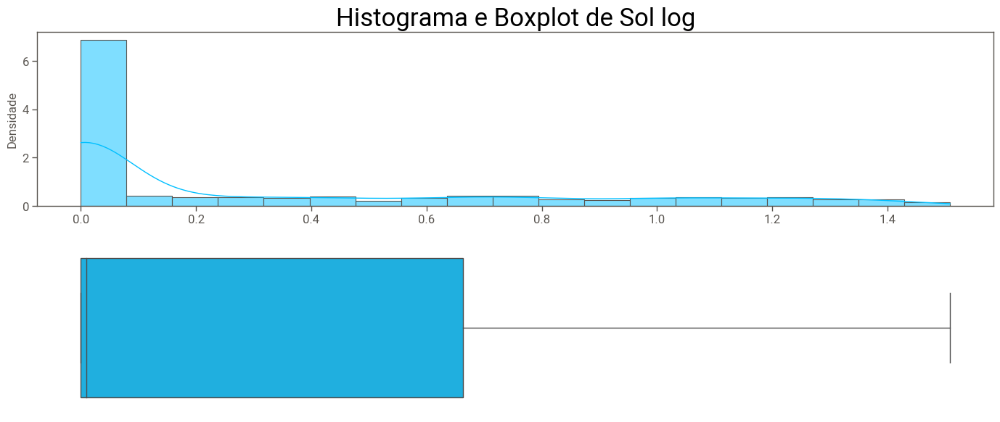

In [ ]:
distribution_plot(treino.sol, 'Sol', color='deepskyblue')

distribution_plot(np.log1p(treino.sol), 'Sol log')

<ipython-input-221-8efbef8589db>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


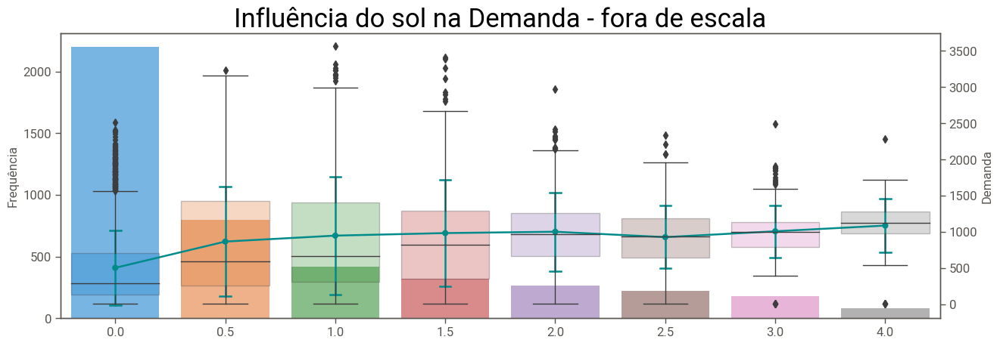

In [ ]:
def sol_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'sol'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[-1,0, 0.5,1, 1.5,2,2.5, 3, 4 ],
                               labels=[0, 0.5,1, 1.5,2,2.5, 3, 4 ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência do {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
sol_plot(treino)




* Diferente da chuva, o Sol apresenta os valores um pouco melhor distribuídos mesmo tendo a maior parcela com valores zerados;
* Assim como na chuva, existe a possibilidade de classificar em sol ou não (binário);
* Uma outra possbilidade seria excluir o Sol visto que este já está representado pelo horário do dia (vide Gráfico abaixo)


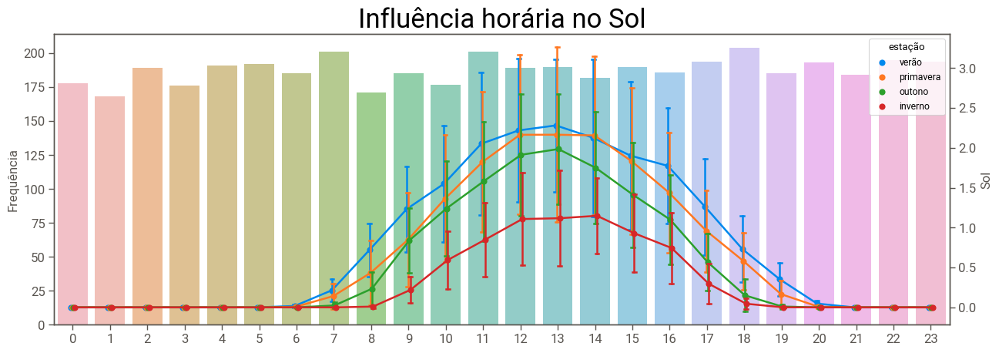

In [ ]:
def hora_sol_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'hora'

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title(f'Influência horária no Sol', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='sol',
                  dodge=0.1, capsize=.1, data=data, hue=hue, row=hue, ax = ax2, ci='sd')
    ax2.set_ylabel('Sol', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
    
hora_sol_plot(treino, hue = 'estação')

## `vento`

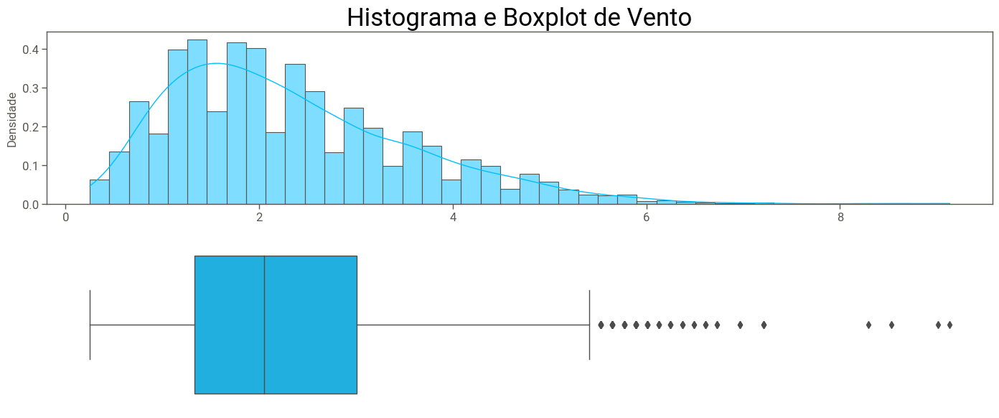

In [ ]:
distribution_plot(treino.vento, 'Vento', color='deepskyblue')

<ipython-input-224-414aee748765>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


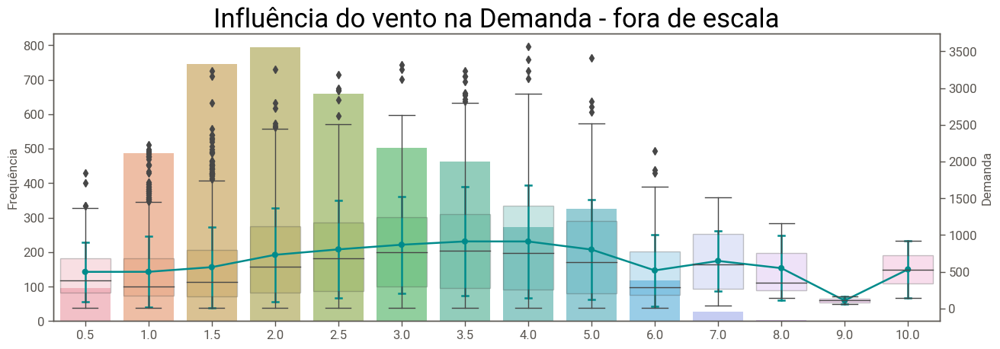

In [ ]:
def vento_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'vento'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[0, 0.5,1, 1.5,2,2.5, 3,3.5, 4,5,6,7,8,9,10 ],
                               labels=[0.5,1, 1.5,2,2.5, 3,3.5, 4,5,6,7,8,9,10 ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência do {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
vento_plot(treino)

* Observa-se uma maior demanda quando o vento está entre 2,5 e 4
* Nota-se ainda que existem poucos valores acima de 5. Dessa forma, poderíamos estipular esse valor como o máximo, tornando os valores maiores iguais a esse

## `visibilidade`

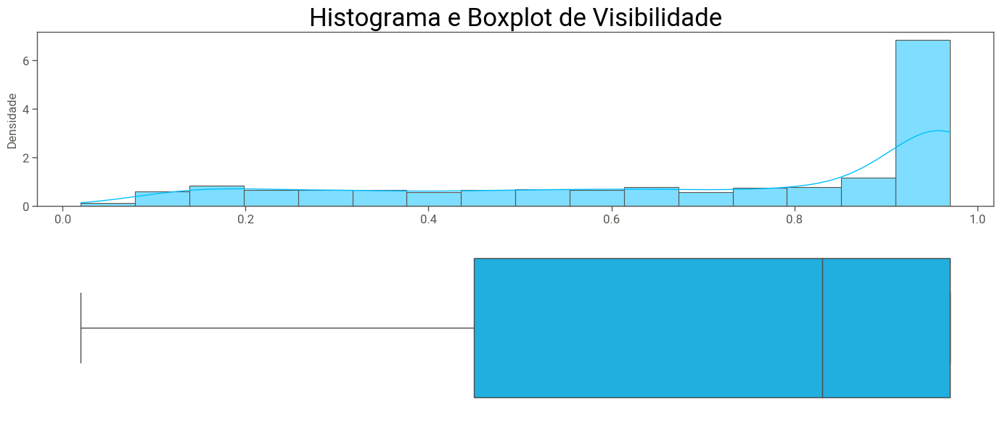

In [ ]:
distribution_plot(treino.visibilidade, 'Visibilidade', color='deepskyblue')


<ipython-input-228-5dbb87e5b327>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


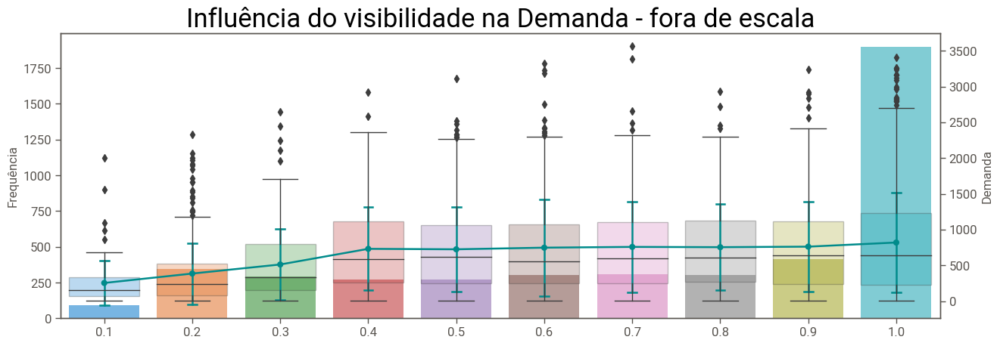

In [ ]:
def visibilidade_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'visibilidade'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[0, 0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,.9,1 ],
                               labels=[ 0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,.9,1 ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência do {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  
    
visibilidade_plot(treino)

* Nota-se que quando a visibilidade é maior que 0.3, a demanda parece estabilizar

## `umidade`

* De acordo com a OMS (Organização Mundial de Saúde), o nível ideal de umidade do ar para o organismo humano gira entre 40% e 70%. Quando a taxa cai para 30% é considerada uma situação de alerta e prejuízos para a saúde se tornam mais evidentes.

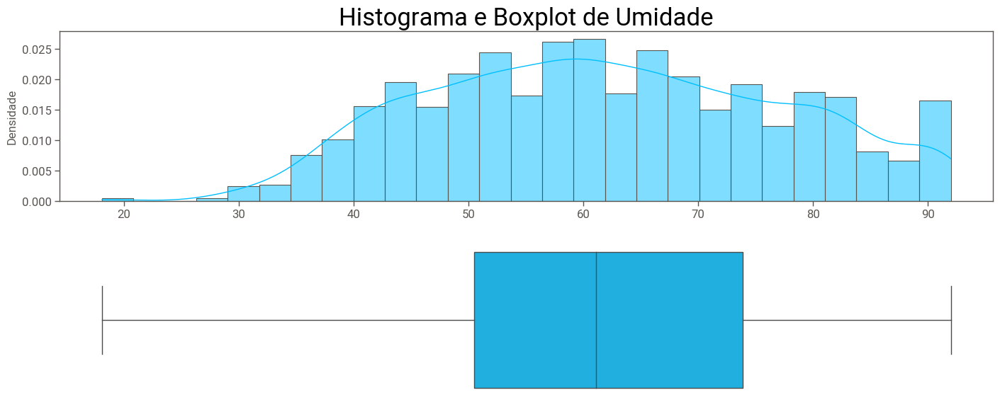

In [ ]:
distribution_plot(treino.umidade, 'Umidade', color='deepskyblue')

<ipython-input-231-bdd4f10e9b60>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


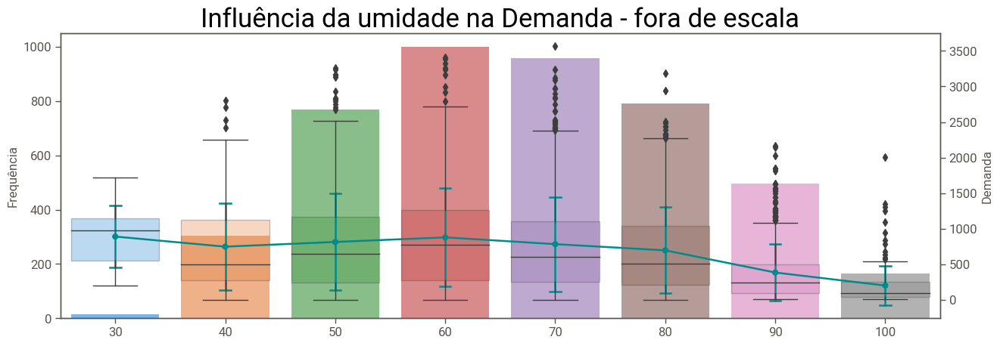

In [ ]:
def umidade_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'umidade'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[ 20,30,40,50,60,70,80,90,100 ],
                               labels=[ 30,40,50,60,70,80,90,100  ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência da {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
umidade_plot(treino)

In [ ]:
treino.umidade.quantile(0.025)

36.2

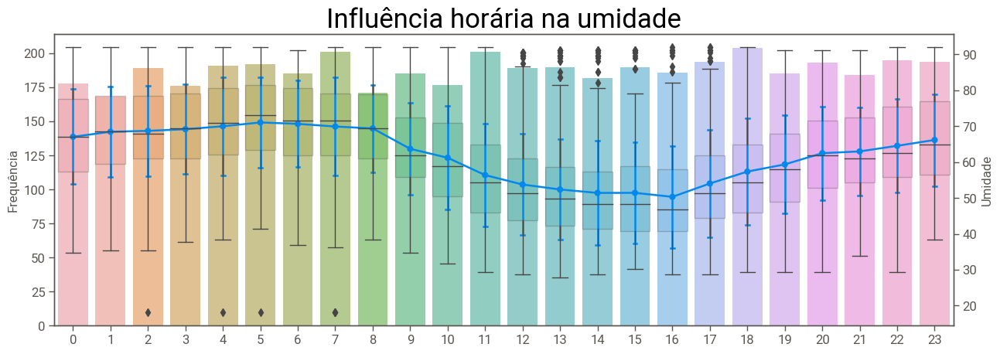

In [ ]:
def hora_umidade_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'hora'

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title(f'Influência horária na umidade', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='umidade',
                  dodge=0.1, capsize=.1, data=data, hue=hue, row=hue, ax = ax2, ci='sd')
    sns.boxplot(x=col_name, y='umidade', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Umidade', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
    
hora_umidade_plot(treino)

## `temperatura`

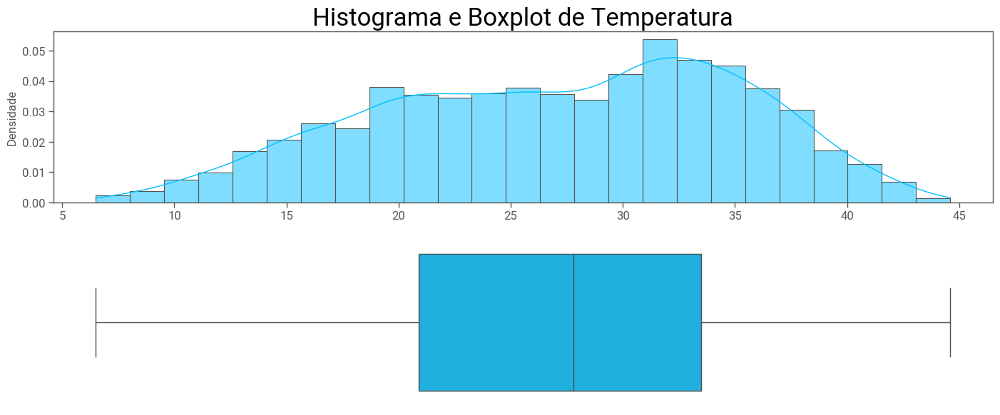

In [ ]:
distribution_plot(treino.temperatura, 'Temperatura', color='deepskyblue')

<ipython-input-256-2a5317729268>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[col_name] = pd.cut(data[col_name],


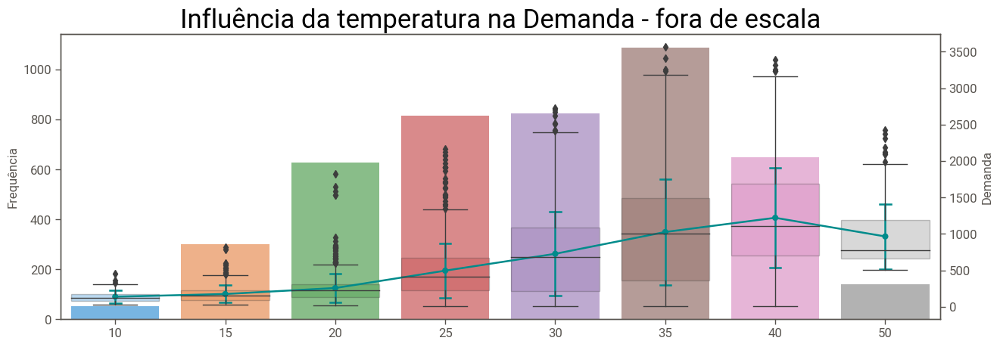

In [ ]:
def temperatura_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'temperatura'
    data = data[[col_name, 'aluguéis']]
    data[col_name] = pd.cut(data[col_name],
                               bins=[ 0,10,15,20,25,30,35,40,50 ],
                               labels=[ 10,15,20,25,30,35,40,50  ])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax=ax1, alpha=0.6)     \
                 .set_title(f'Influência da {col_name} na Demanda - fora de escala', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='aluguéis',
                  dodge=0.1, capsize=.1, data=data, color=color, hue=hue, row=hue, ax=ax2, ci='sd')
    
    sns.boxplot(x=col_name, y='aluguéis', data=data, ax=ax2, boxprops=dict(alpha=.3) )
    ax2.set_ylabel('Demanda', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  

    
temperatura_plot(treino)

* Observa-se uma tendência de aumento da demanda com o aumento da temperatura até T = 40
* Depois, um leve declínio que pode estar relacionado a uma menor qtde de dados

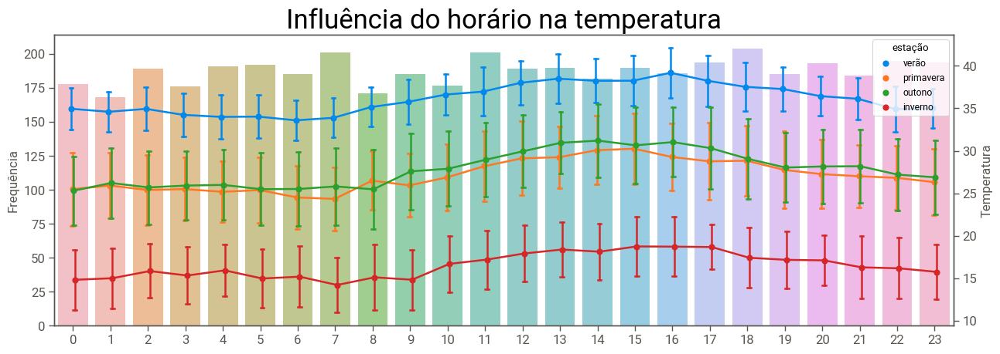

In [ ]:
def hora_temp_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'hora'

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=data, ax = ax1, alpha=0.6) \
                 .set_title(f'Influência do horário na temperatura', fontsize=25)
    ax1.set(xlabel=None)
    ax1.set_ylabel('Frequência', size=12)
    ax1.tick_params(axis='x', labelsize= 12)
    ax1.tick_params(axis='y', labelsize= 12)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='temperatura',
                  dodge=0.1, capsize=.1, data=data,  hue=hue, row=hue, ax = ax2, ci='sd') 
    ax2.set_ylabel('Temperatura', size=12)
    ax2.tick_params(axis='y', labelsize= 12)  
    
hora_temp_plot(treino, hue='estação')

In [ ]:
### Avaliando sensação termica

def aux_sensacao(x):
    temp = 1.8 * x.temperatura + 32
    vent = 2.23694 * x.vento
    return 35.74 + 0.6215 * temp - 35.75 * (vent ** 0.16) + 0.4275 * temp * (vent ** 0.16)
            
def dados_sensacao(df):
    df['sensacao'] = df[['vento', 'temperatura']].apply(aux_sensacao, axis = 1)   
    return df


def aux_indice_calor(x):
    temp = 1.8 * x.temperatura + 32
    umid = x.umidade / 100
    hi = 1.1 * temp - 10.3 + 0.047 * umid
    if hi < 80:
        return (hi - 32)/1.8
    else:
        hi = -42.379 + 2.04901523 * temp +         10.14333127 * umid - 0.22475541 * temp * umid -        0.00683783 * (temp ** 2) -        0.05481717 * (umid ** 2) +         0.00122874 * (temp ** 2) * umid +        0.00085282 * temp * (umid ** 2) -        0.00000199 * (temp ** 2) * (umid ** 2)
        if (80 <= temp <= 112) and (umid <= 0.13):
            hi = hi - (3.25 - 0.25*umid) * ((abs(17 - (abs(temp - 95))))/17)**0.5
            return (hi - 32)/1.8
        elif (80 <= temp <= 87) and (umid > 0.85):
            hi = hi + 0.02*(umid - 85)*(87 - temp)
            return (hi - 32)/1.8
        else:
            return (hi - 32)/1.8
    
    
def dados_indice_calor(df):
    df['HI'] = df[['temperatura', 'umidade']].apply(aux_indice_calor, axis = 1)   
    return df


treino = dados_sensacao(treino)
teste = dados_sensacao(teste)

treino = dados_indice_calor(treino)
teste = dados_indice_calor(teste)


In [ ]:
# Estação

In [ ]:
treino.groupby(['estação'])[['umidade', 'aluguéis', 'temperatura','vento']].agg(['mean', 'min','max'])

umidade                 aluguéis           temperatura        \
                mean   min   max         mean min   max        mean   min   
estação                                                                     
inverno    55.666100  28.7  91.2   233.343720  10   824   16.489424   6.5   
outono     62.308429  27.9  91.2   866.267081   5  3261   27.887311  16.7   
primavera  62.886231  18.1  92.0   727.883821   5  3260   27.096816  13.9   
verão      66.967274  33.9  92.0  1044.329861  21  3566   36.119618  29.4   

                    vento              
            max      mean   min   max  
estação                                
inverno    24.7  2.523994  0.25  8.29  
outono     38.3  2.063310  0.25  6.73  
primavera  37.7  2.499019  0.37  9.13  
verão      44.6  2.214479  0.25  8.53